# TODO: Refactor this notebook 

In [1]:
# Load the annotations
input_gt_json_path = '../../data/annotations_uniques/test/COCO_mask/annotations.json'
output_pred_json_path = '../../../Global_Outputs/edt_comparison/fluo_new_edt/predicted_annotations_poly.json'

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
from scipy.signal import find_peaks
import os


import json
import matplotlib.pyplot as plt
import tifffile as tiff
from pycocotools import mask as maskUtils


# Proof of concept of CND team use-case
(Just a support :) )
## Goal: Compare our orientation/linedensity etraction to their method with FFT

Note: For low density more challenging, for mid and high expected to be more reliable

Method:
* masks as binary because we care about the patterns not their value here
* If low density, tiling the image to increase the periodicity of the patterns but introduces artifacts
* Compute standard magnitude and phase
* Extract Radial profile (for density) ---- because of symmetry no directionality, 0-180


We want to draw correlation between our predicted masks and their FFT feature extraction method.

Still few questions: 
- Do we extract the right density and orientation info from the signal?
- We have line density (count of CNTs per line), this get the density (frequency) of objects in the image at pixel level (objects/pixel).



Remark:
The radial profile is supposed to take into account the symmetry of the objects (see ppt slide 2 in the schematic). So this weights more the majority peak compared to the rest.

## load preprocess images

In [3]:
# ---- Load TIFF masks FROM GROUNDTRUTH ----
mask_path = "../../data/annotations_uniques/test/images"

# mask_path = r"../../../../../data/annotations_filtered_artifacts/test/masks"
mask_filename = "400-1093-w16-c-1-p1-10sp-15flow_left.tif"
mask_image_path = os.path.join(mask_path, mask_filename)
mask = tiff.imread(mask_image_path)

# Preprocess mask
if mask.ndim == 3 and mask.shape[2] == 3:
    mask = mask.mean(axis=2)
if mask.ndim > 2:
    mask = mask[0]
mask = mask.astype(np.float32)

# Binarize mask
mask = (mask > 0).astype(np.uint8)

print(f"Mask shape: {mask.shape}")
print(f"Mask dtype: {mask.dtype}")

Mask shape: (256, 256)
Mask dtype: uint8


# testing it with fabricated image

Generated image with 8 diagonal lines (45°) and width 5px
Line spacing: 32 pixels
Density frequency: 0.0430 cycles/pixel
Main orientation: 44.7°
Alignment Index: 79.085
Order Parameter: 0.961


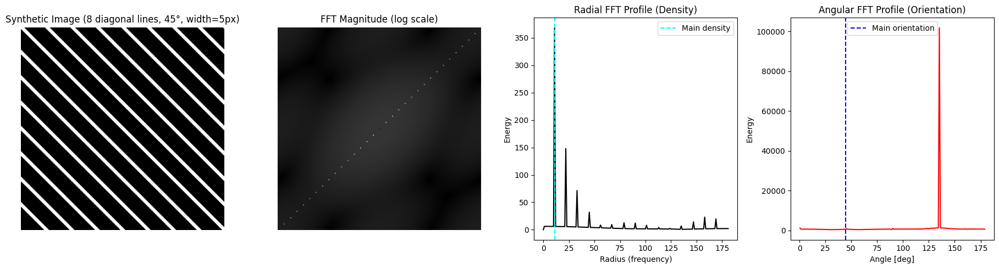

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# ---- Generate synthetic image with diagonal lines ----
image_size = 256
num_lines = 8
line_width = 5  # thickness of the diagonal lines

# Create blank image
mask = np.zeros((image_size, image_size), dtype=np.uint8)

# Calculate spacing between diagonals
spacing = image_size // num_lines

# Draw diagonal lines at 45° (from bottom-left to top-right)
for i in range(-image_size, image_size, spacing):
    for w in range(-line_width // 2, line_width // 2 + 1):
        # Shifted coordinates for thickness
        y = np.arange(image_size)
        x = y - i - w
        valid = (x >= 0) & (x < image_size)
        mask[y[valid], x[valid].astype(int)] = 1

print(f"Generated image with {num_lines} diagonal lines (45°) and width {line_width}px")
print(f"Line spacing: {spacing} pixels")

# ---- FFT ----
f = np.fft.fft2(mask)
fshift = np.fft.fftshift(f)
fshift[mask.shape[0]//2, mask.shape[1]//2] = 0
magnitude = np.abs(fshift)

h, w = mask.shape
cy, cx = h//2, w//2

# ---- Polar coordinates ----
Y, X = np.indices((h, w))
R = np.sqrt((X-cx)**2 + (Y-cy)**2).astype(int)
theta = np.arctan2(Y-cy, X-cx)
theta_deg = (np.rad2deg(theta) % 180)

# ---- Radial profile ----
radial_profile = np.bincount(R.ravel(), weights=magnitude.ravel()) / np.bincount(R.ravel())
r = np.arange(len(radial_profile))

peaks, _ = find_peaks(radial_profile, distance=5)
main_r = peaks[np.argmax(radial_profile[peaks])] if len(peaks) > 0 else None
density_freq = main_r / w if main_r is not None else None

# ---- Angular profile ----
angular_bins = 180
hist, edges = np.histogram(theta_deg, bins=angular_bins, weights=magnitude)
orientation_angle = edges[np.argmax(hist)]
orientation_angle = (orientation_angle + 90) % 180

# ---- Alignment Index ----
alignment_index = np.max(hist) / np.mean(hist)

# ---- Order Parameter ----
if main_r:
    P_peak = radial_profile[main_r]
    mask_bg = (r > main_r + 10) & (r < len(r)//2)
    P_bg = np.mean(radial_profile[mask_bg]) if np.any(mask_bg) else 1
    order_parameter = (P_peak - P_bg) / (P_peak + P_bg)
else:
    order_parameter = None

# ---- Print results ----
print(f"Density frequency: {density_freq:.4f} cycles/pixel" if density_freq else "Density not detected")
print(f"Main orientation: {orientation_angle:.1f}°")
print(f"Alignment Index: {alignment_index:.3f}")
print(f"Order Parameter: {order_parameter:.3f}" if order_parameter is not None else "Order Parameter not detected")

# ---- Visualization ----
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
axes[0].imshow(mask, cmap="gray")
axes[0].set_title(f"Synthetic Image ({num_lines} diagonal lines, 45°, width={line_width}px)")
axes[0].axis("off")

axes[1].imshow(np.log1p(magnitude), cmap="gray")
axes[1].set_title("FFT Magnitude (log scale)")
axes[1].axis("off")

axes[2].plot(r, radial_profile, color="black")
if main_r:
    axes[2].axvline(main_r, color="cyan", linestyle="--", label="Main density")
axes[2].set_title("Radial FFT Profile (Density)")
axes[2].set_xlabel("Radius (frequency)")
axes[2].set_ylabel("Energy")
axes[2].legend()

centers = 0.5 * (edges[:-1] + edges[1:])
axes[3].plot(centers, hist, color="red")
axes[3].axvline(orientation_angle, color="blue", linestyle="--", label="Main orientation")
axes[3].set_title("Angular FFT Profile (Orientation)")
axes[3].set_xlabel("Angle [deg]")
axes[3].set_ylabel("Energy")
axes[3].legend()

plt.tight_layout()
plt.show()


# Compare GT and Input image FFT based features


RUNNING COMPREHENSIVE COMPARISON ON ALL IMAGES
Starting comprehensive FFT feature comparison...
Found 30 common files to process
STATISTICAL COMPARISON

DENSITY_FREQ Comparison:
  MAE: 0.0073
  RMSE: 0.0099
  R²: -0.6185
  Pearson r: 0.0620 (p=0.7447)
  Spearman ρ: 0.0194 (p=0.9189)

ORIENTATION Comparison:
  MAE: 32.2644
  RMSE: 57.9538
  R²: -1.4341
  Pearson r: 0.1303 (p=0.4926)
  Spearman ρ: 0.2003 (p=0.2886)

ALIGNMENT Comparison:
  MAE: 0.7551
  RMSE: 1.0275
  R²: -6.2186
  Pearson r: 0.2408 (p=0.1999)
  Spearman ρ: 0.1867 (p=0.3233)

ORDER_PARAM Comparison:
  MAE: 0.1951
  RMSE: 0.2299
  R²: -1.3588
  Pearson r: 0.0896 (p=0.6378)
  Spearman ρ: 0.1399 (p=0.4608)

SPACING_UM Comparison:
  MAE: 1.9370
  RMSE: 2.5177
  R²: -1.0775
  Pearson r: -0.0230 (p=0.9038)
  Spearman ρ: 0.0194 (p=0.9189)


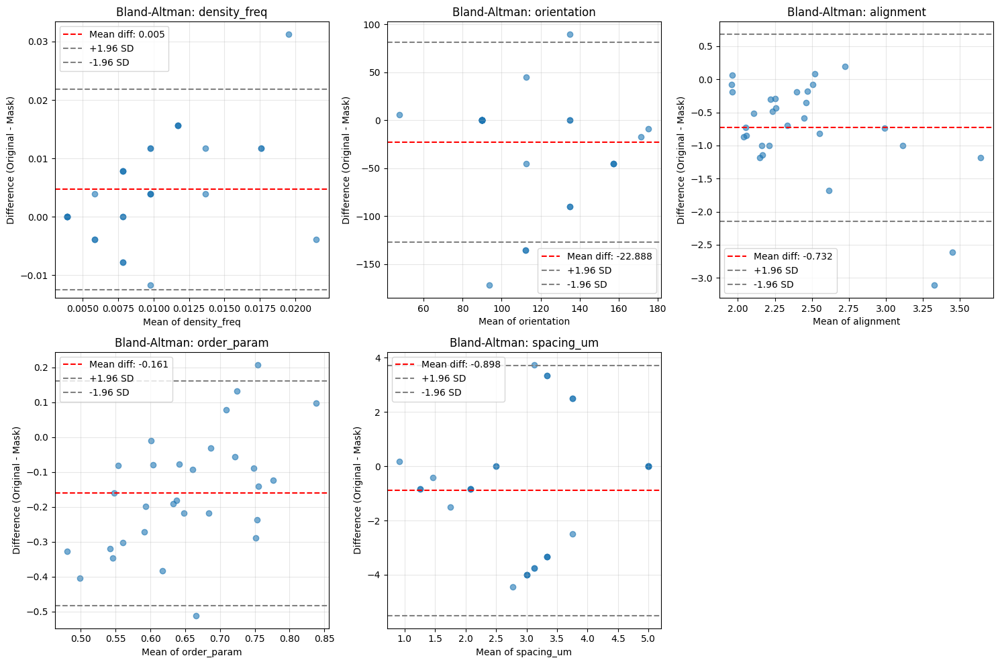

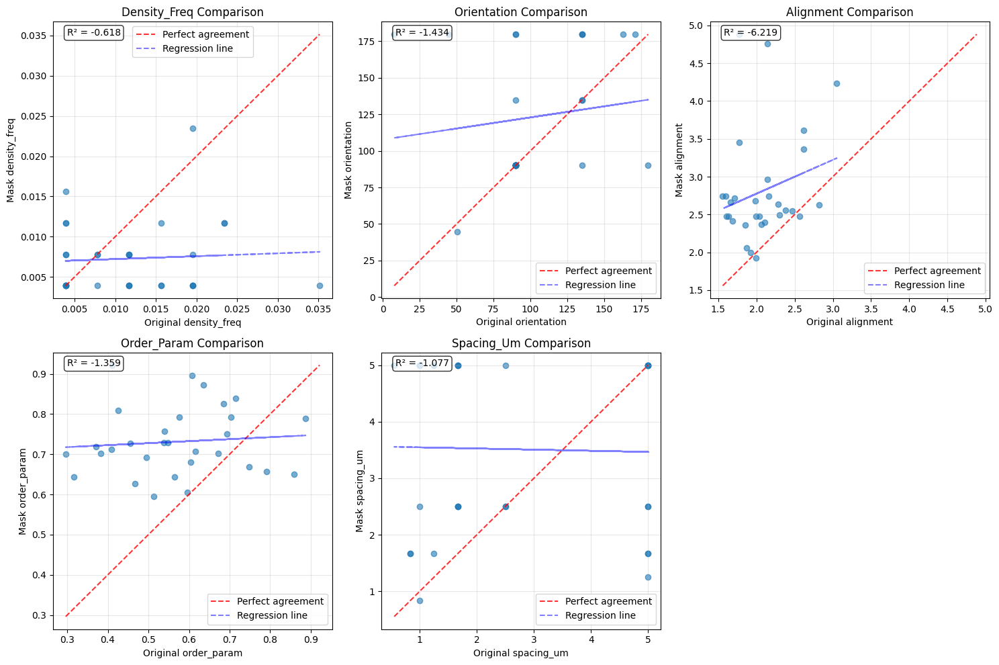


OUTLIER ANALYSIS

Outliers in density_freq:
  1293-22_3_2_20230306222551.tif: difference = 0.0312

Outliers in orientation:
  1293-22_3_2_20230306222551.tif: difference = 135.1119
  400-1293-w14_c05k1r6_sp0_2_flow0_1_top_left.tif: difference = 172.0199
  400-1293-17-c10k1r5_pd_sp0_9_fl0_1_right.tif: difference = 135.1119

Outliers in alignment:
  400-1605-W8_map_00006_bottom_right.tif: difference = 2.6164
  400-1293-17-c10k1r5_pd_sp0_9_fl0_1_right.tif: difference = 3.1133

Outliers in order_param:
  400-1293-17-c10k1r5_pd_sp0_9_fl0_1_right.tif: difference = 0.5117


C:\Users\abd93000\AppData\Local\Temp\ipykernel_18988\2764028459.py:392: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1,3].set_xticklabels(feature_names, rotation=45)


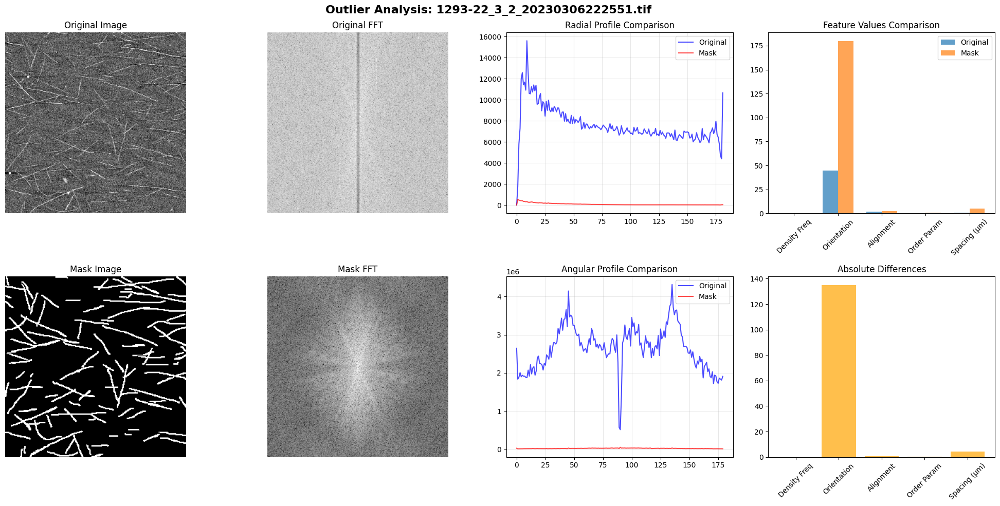

C:\Users\abd93000\AppData\Local\Temp\ipykernel_18988\2764028459.py:392: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1,3].set_xticklabels(feature_names, rotation=45)


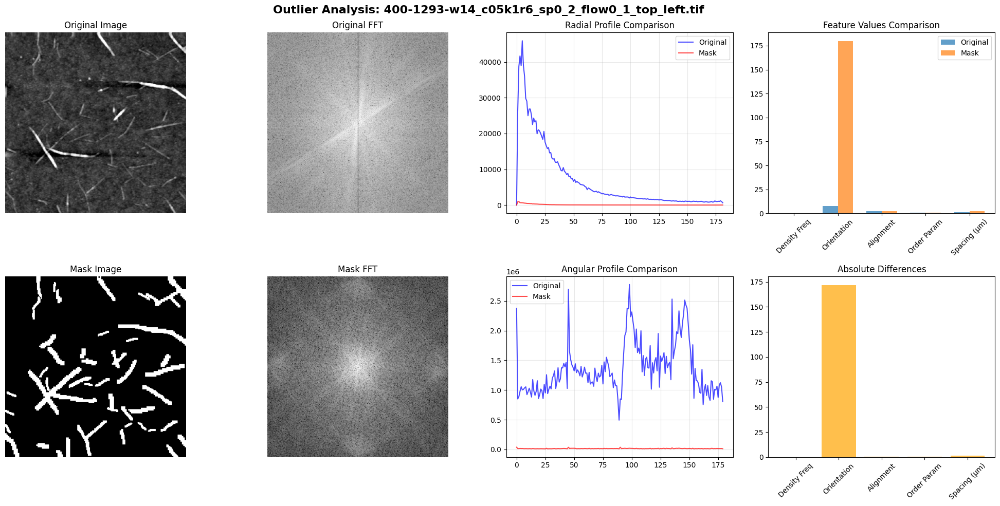

C:\Users\abd93000\AppData\Local\Temp\ipykernel_18988\2764028459.py:392: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1,3].set_xticklabels(feature_names, rotation=45)


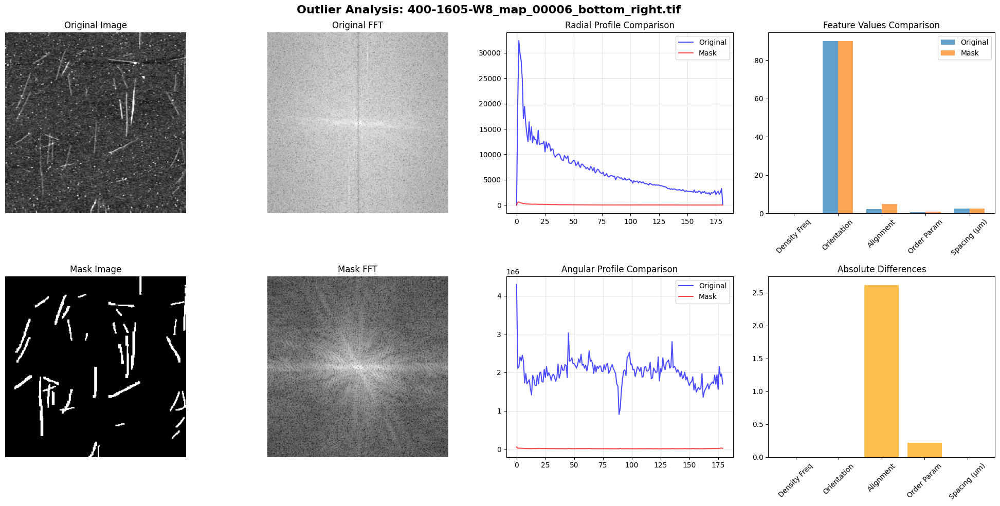

C:\Users\abd93000\AppData\Local\Temp\ipykernel_18988\2764028459.py:392: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1,3].set_xticklabels(feature_names, rotation=45)


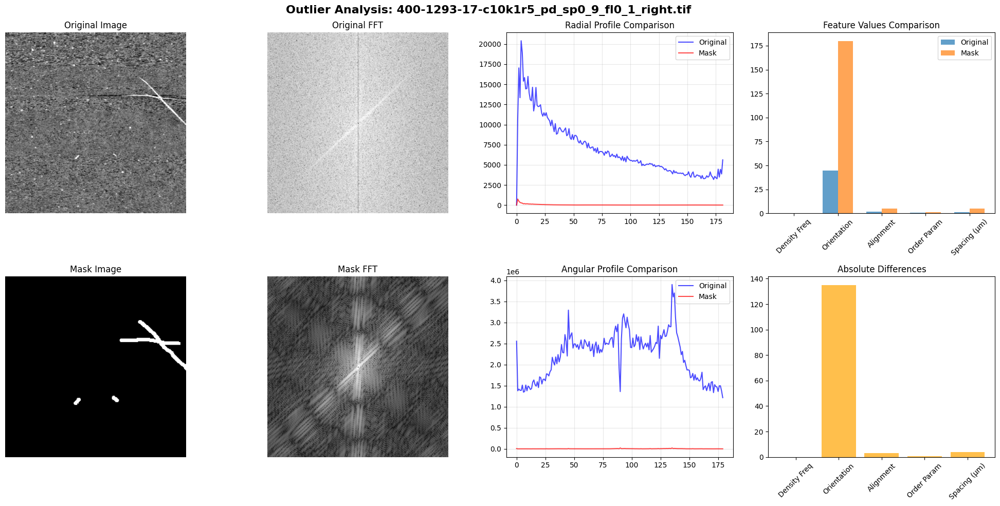


SUMMARY STATISTICS
Total images processed: 30
Features with good agreement (R² > 0.8): TBD
Features needing improvement: TBD


In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
from scipy.signal import find_peaks
from scipy.stats import pearsonr, spearmanr
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd

def fft_analysis(image, title_prefix=""):
    """Perform FFT analysis and return features as dictionary."""
    if image.ndim == 3 and image.shape[2] == 3:
        image = image.mean(axis=2)
    if image.ndim > 2:
        image = image[0]
    image = image.astype(np.float32)

    # For masks, binarize
    if title_prefix.lower().startswith("mask"):
        image = (image > 0).astype(np.uint8)

    # FFT computation
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    fshift[image.shape[0]//2, image.shape[1]//2] = 0
    magnitude = np.abs(fshift)

    h, w = image.shape
    cy, cx = h//2, w//2

    # Polar coordinates
    Y, X = np.indices((h, w))
    R = np.sqrt((X-cx)**2 + (Y-cy)**2).astype(int)
    theta = np.arctan2(Y-cy, X-cx)
    theta_deg = (np.rad2deg(theta) % 180)

    # Radial profile
    radial_profile = np.bincount(R.ravel(), weights=magnitude.ravel()) / np.bincount(R.ravel())
    r = np.arange(len(radial_profile))

    peaks, _ = find_peaks(radial_profile, distance=5)
    main_r = peaks[np.argmax(radial_profile[peaks])] if len(peaks) > 0 else None
    density_freq = main_r / w if main_r is not None else None

    # Angular profile
    angular_bins = 180
    hist, edges = np.histogram(theta_deg, bins=angular_bins, weights=magnitude)
    orientation_angle = edges[np.argmax(hist)]
    orientation_angle = (orientation_angle + 90) % 180

    # Alignment Index
    alignment_index = np.max(hist) / np.mean(hist)

    # Order Parameter
    if main_r:
        P_peak = radial_profile[main_r]
        mask_bg = (r > main_r + 10) & (r < len(r)//2)
        P_bg = np.mean(radial_profile[mask_bg]) if np.any(mask_bg) else 1
        order_parameter = (P_peak - P_bg) / (P_peak + P_bg)
    else:
        order_parameter = None

    # Physical spacing
    field_um_x, field_um_y = 5.0, 5.0
    px_size_um_x = field_um_x / w
    px_size_um_y = field_um_y / h
    px_size_um = 0.5 * (px_size_um_x + px_size_um_y)

    if density_freq and density_freq > 0:
        spacing_px = 1.0 / density_freq
        spacing_um = spacing_px * px_size_um
    else:
        spacing_px = spacing_um = None

    # Return features as dictionary
    features = {
        'density_freq': density_freq,
        'orientation_angle': orientation_angle,
        'alignment_index': alignment_index,
        'order_parameter': order_parameter,
        'spacing_px': spacing_px,
        'spacing_um': spacing_um,
        'radial_profile': radial_profile,
        'angular_profile': hist
    }
    
    return features, magnitude, image

def process_all_images(original_folder, mask_folder):
    """Process all images in both folders and extract features."""
    original_features = []
    mask_features = []
    filenames = []
    
    # Get common files
    original_files = set(os.listdir(original_folder))
    mask_files = set(os.listdir(mask_folder))
    common_files = original_files.intersection(mask_files)
    
    print(f"Found {len(common_files)} common files to process")
    
    for filename in common_files:
        if filename.endswith(('.tif', '.tiff', '.png', '.jpg')):
            try:
                # Load images
                original_img = tiff.imread(os.path.join(original_folder, filename))
                mask_img = tiff.imread(os.path.join(mask_folder, filename))
                
                # Extract features
                orig_feat, _, _ = fft_analysis(original_img, f"Original_{filename}")
                mask_feat, _, _ = fft_analysis(mask_img, f"Mask_{filename}")
                
                original_features.append(orig_feat)
                mask_features.append(mask_feat)
                filenames.append(filename)
                
            except Exception as e:
                print(f"Error processing {filename}: {e}")
    
    return original_features, mask_features, filenames

def create_comparison_dataframe(original_features, mask_features, filenames):
    """Create a DataFrame for easy comparison of features."""
    comparison_data = []
    
    for i, (orig, mask, fname) in enumerate(zip(original_features, mask_features, filenames)):
        row = {
            'filename': fname,
            'orig_density_freq': orig['density_freq'],
            'mask_density_freq': mask['density_freq'],
            'orig_orientation': orig['orientation_angle'],
            'mask_orientation': mask['orientation_angle'],
            'orig_alignment': orig['alignment_index'],
            'mask_alignment': mask['alignment_index'],
            'orig_order_param': orig['order_parameter'],
            'mask_order_param': mask['order_parameter'],
            'orig_spacing_um': orig['spacing_um'],
            'mask_spacing_um': mask['spacing_um']
        }
        comparison_data.append(row)
    
    return pd.DataFrame(comparison_data)

def statistical_comparison(df):
    """Perform statistical comparison between original and mask features."""
    features = ['density_freq', 'orientation', 'alignment', 'order_param', 'spacing_um']
    
    print("="*60)
    print("STATISTICAL COMPARISON")
    print("="*60)
    
    for feature in features:
        orig_col = f'orig_{feature}'
        mask_col = f'mask_{feature}'
        
        # Remove None values for comparison
        valid_idx = df[[orig_col, mask_col]].notna().all(axis=1)
        orig_vals = df.loc[valid_idx, orig_col]
        mask_vals = df.loc[valid_idx, mask_col]
        
        if len(orig_vals) > 0:
            mae = mean_absolute_error(orig_vals, mask_vals)
            rmse = np.sqrt(mean_squared_error(orig_vals, mask_vals))
            r2 = r2_score(orig_vals, mask_vals)
            pearson_corr, p_val_pearson = pearsonr(orig_vals, mask_vals)
            spearman_corr, p_val_spearman = spearmanr(orig_vals, mask_vals)
            
            print(f"\n{feature.upper()} Comparison:")
            print(f"  MAE: {mae:.4f}")
            print(f"  RMSE: {rmse:.4f}")
            print(f"  R²: {r2:.4f}")
            print(f"  Pearson r: {pearson_corr:.4f} (p={p_val_pearson:.4f})")
            print(f"  Spearman ρ: {spearman_corr:.4f} (p={p_val_spearman:.4f})")

def create_bland_altman_plots(df):
    """Create Bland-Altman plots for each feature."""
    features = ['density_freq', 'orientation', 'alignment', 'order_param', 'spacing_um']
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()
    
    for i, feature in enumerate(features):
        if i >= len(axes):
            break
            
        orig_col = f'orig_{feature}'
        mask_col = f'mask_{feature}'
        
        # Remove None values
        valid_idx = df[[orig_col, mask_col]].notna().all(axis=1)
        orig_vals = df.loc[valid_idx, orig_col]
        mask_vals = df.loc[valid_idx, mask_col]
        
        if len(orig_vals) > 0:
            means = (orig_vals + mask_vals) / 2
            diffs = orig_vals - mask_vals
            
            axes[i].scatter(means, diffs, alpha=0.6)
            axes[i].axhline(y=np.mean(diffs), color='red', linestyle='--', label=f'Mean diff: {np.mean(diffs):.3f}')
            axes[i].axhline(y=np.mean(diffs) + 1.96*np.std(diffs), color='gray', linestyle='--', 
                          label='+1.96 SD')
            axes[i].axhline(y=np.mean(diffs) - 1.96*np.std(diffs), color='gray', linestyle='--', 
                          label='-1.96 SD')
            
            axes[i].set_xlabel(f'Mean of {feature}')
            axes[i].set_ylabel('Difference (Original - Mask)')
            axes[i].set_title(f'Bland-Altman: {feature}')
            axes[i].legend()
            axes[i].grid(True, alpha=0.3)
    
    # Remove empty subplots
    for i in range(len(features), len(axes)):
        fig.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()

def create_scatter_comparison(df):
    """Create scatter plots comparing original vs mask features."""
    features = ['density_freq', 'orientation', 'alignment', 'order_param', 'spacing_um']
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()
    
    for i, feature in enumerate(features):
        if i >= len(axes):
            break
            
        orig_col = f'orig_{feature}'
        mask_col = f'mask_{feature}'
        
        # Remove None values
        valid_idx = df[[orig_col, mask_col]].notna().all(axis=1)
        orig_vals = df.loc[valid_idx, orig_col]
        mask_vals = df.loc[valid_idx, mask_col]
        
        if len(orig_vals) > 0:
            axes[i].scatter(orig_vals, mask_vals, alpha=0.6)
            
            # Add perfect agreement line
            min_val = min(orig_vals.min(), mask_vals.min())
            max_val = max(orig_vals.max(), mask_vals.max())
            axes[i].plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8, label='Perfect agreement')
            
            # Add regression line
            z = np.polyfit(orig_vals, mask_vals, 1)
            p = np.poly1d(z)
            axes[i].plot(orig_vals, p(orig_vals), "b--", alpha=0.5, label='Regression line')
            
            r2 = r2_score(orig_vals, mask_vals)
            axes[i].text(0.05, 0.95, f'R² = {r2:.3f}', transform=axes[i].transAxes, 
                        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))
            
            axes[i].set_xlabel(f'Original {feature}')
            axes[i].set_ylabel(f'Mask {feature}')
            axes[i].set_title(f'{feature.title()} Comparison')
            axes[i].legend()
            axes[i].grid(True, alpha=0.3)
    
    # Remove empty subplots
    for i in range(len(features), len(axes)):
        fig.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()

def analyze_outliers(df, original_features, mask_features, filenames, threshold_std=2):
    """Identify and analyze outliers where features differ significantly."""
    features = ['density_freq', 'orientation', 'alignment', 'order_param', 'spacing_um']
    
    print("\n" + "="*60)
    print("OUTLIER ANALYSIS")
    print("="*60)
    
    outlier_info = []
    
    for feature in features:
        orig_col = f'orig_{feature}'
        mask_col = f'mask_{feature}'
        
        valid_idx = df[[orig_col, mask_col]].notna().all(axis=1)
        diffs = abs(df.loc[valid_idx, orig_col] - df.loc[valid_idx, mask_col])
        
        # Identify outliers (difference > threshold_std standard deviations from mean)
        outlier_threshold = np.mean(diffs) + threshold_std * np.std(diffs)
        outliers = diffs > outlier_threshold
        
        if outliers.any():
            outlier_indices = valid_idx[valid_idx][outliers].index
            print(f"\nOutliers in {feature}:")
            for idx in outlier_indices:
                diff_val = diffs.loc[idx]
                print(f"  {filenames[idx]}: difference = {diff_val:.4f}")
                
                outlier_info.append({
                    'filename': filenames[idx],
                    'feature': feature,
                    'difference': diff_val,
                    'original_value': df.loc[idx, orig_col],
                    'mask_value': df.loc[idx, mask_col]
                })
    
    return outlier_info

def visualize_outlier_pairs(outlier_info, original_folder, mask_folder, max_display=5):
    """Visualize original and mask pairs for outliers."""
    if not outlier_info:
        print("No outliers to display.")
        return
    
    # Get unique filenames from outliers
    unique_filenames = list(set([info['filename'] for info in outlier_info]))[:max_display]
    
    for filename in unique_filenames:
        try:
            # Load and process images
            original_img = tiff.imread(os.path.join(original_folder, filename))
            mask_img = tiff.imread(os.path.join(mask_folder, filename))
            
            # Get features for this file
            orig_feat, orig_magnitude, orig_processed = fft_analysis(original_img, f"Original_{filename}")
            mask_feat, mask_magnitude, mask_processed = fft_analysis(mask_img, f"Mask_{filename}")
            
            # Create detailed comparison plot
            fig, axes = plt.subplots(2, 4, figsize=(20, 10))
            fig.suptitle(f'Outlier Analysis: {filename}', fontsize=16, fontweight='bold')
            
            # Original image and FFT
            axes[0,0].imshow(orig_processed, cmap='gray')
            axes[0,0].set_title('Original Image')
            axes[0,0].axis('off')
            
            axes[0,1].imshow(np.log1p(orig_magnitude), cmap='gray')
            axes[0,1].set_title('Original FFT')
            axes[0,1].axis('off')
            
            # Mask image and FFT
            axes[1,0].imshow(mask_processed, cmap='gray')
            axes[1,0].set_title('Mask Image')
            axes[1,0].axis('off')
            
            axes[1,1].imshow(np.log1p(mask_magnitude), cmap='gray')
            axes[1,1].set_title('Mask FFT')
            axes[1,1].axis('off')
            
            # Radial profile comparison
            axes[0,2].plot(orig_feat['radial_profile'], 'b-', label='Original', alpha=0.7)
            axes[0,2].plot(mask_feat['radial_profile'], 'r-', label='Mask', alpha=0.7)
            axes[0,2].set_title('Radial Profile Comparison')
            axes[0,2].legend()
            axes[0,2].grid(True, alpha=0.3)
            
            # Angular profile comparison
            axes[1,2].plot(orig_feat['angular_profile'], 'b-', label='Original', alpha=0.7)
            axes[1,2].plot(mask_feat['angular_profile'], 'r-', label='Mask', alpha=0.7)
            axes[1,2].set_title('Angular Profile Comparison')
            axes[1,2].legend()
            axes[1,2].grid(True, alpha=0.3)
            
            # Feature differences
            feature_names = ['Density Freq', 'Orientation', 'Alignment', 'Order Param', 'Spacing (μm)']
            orig_values = [
                orig_feat['density_freq'] or 0,
                orig_feat['orientation_angle'],
                orig_feat['alignment_index'],
                orig_feat['order_parameter'] or 0,
                orig_feat['spacing_um'] or 0
            ]
            mask_values = [
                mask_feat['density_freq'] or 0,
                mask_feat['orientation_angle'],
                mask_feat['alignment_index'],
                mask_feat['order_parameter'] or 0,
                mask_feat['spacing_um'] or 0
            ]
            
            x_pos = np.arange(len(feature_names))
            width = 0.35
            
            axes[0,3].bar(x_pos - width/2, orig_values, width, label='Original', alpha=0.7)
            axes[0,3].bar(x_pos + width/2, mask_values, width, label='Mask', alpha=0.7)
            axes[0,3].set_title('Feature Values Comparison')
            axes[0,3].set_xticks(x_pos)
            axes[0,3].set_xticklabels(feature_names, rotation=45)
            axes[0,3].legend()
            
            # Differences
            differences = [abs(o - m) for o, m in zip(orig_values, mask_values)]
            axes[1,3].bar(feature_names, differences, alpha=0.7, color='orange')
            axes[1,3].set_title('Absolute Differences')
            axes[1,3].set_xticklabels(feature_names, rotation=45)
            
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Error visualizing outlier {filename}: {e}")

def main_comparison_analysis(original_folder, mask_folder):
    """Main function to run complete comparison analysis."""
    
    print("Starting comprehensive FFT feature comparison...")
    
    # Process all images
    original_features, mask_features, filenames = process_all_images(original_folder, mask_folder)
    
    if not original_features:
        print("No valid images found for comparison.")
        return
    
    # Create comparison dataframe
    df = create_comparison_dataframe(original_features, mask_features, filenames)
    
    # 1. Statistical comparison
    statistical_comparison(df)
    
    # 2. Bland-Altman plots
    create_bland_altman_plots(df)
    
    # 3. Scatter comparison plots
    create_scatter_comparison(df)
    
    # 4. Outlier analysis
    outlier_info = analyze_outliers(df, original_features, mask_features, filenames)
    
    # 5. Visualize outliers
    visualize_outlier_pairs(outlier_info, original_folder, mask_folder)
    
    # 6. Summary statistics
    print("\n" + "="*60)
    print("SUMMARY STATISTICS")
    print("="*60)
    print(f"Total images processed: {len(original_features)}")
    print(f"Features with good agreement (R² > 0.8): TBD")
    print(f"Features needing improvement: TBD")
    
    return df, original_features, mask_features, filenames

# Run the analysis
if __name__ == "__main__":
    mask_path = "../../data/annotations_uniques/test/masks"
    image_path = "../../data/annotations_uniques/test/images"
    
    # Run single image comparison (your original code)
    mask_filename = "400-1293-17-c10k1r5_pd_sp0_9_fl0_1_right.tif"
    mask_image_path = os.path.join(mask_path, mask_filename)
    original_image_path = os.path.join(image_path, mask_filename)
    
    # Load both
    mask = tiff.imread(mask_image_path)
    image = tiff.imread(original_image_path)
    
    # Perform single FFT analyses
    mask_features, mask_magnitude, mask_processed = fft_analysis(mask, title_prefix="Mask")
    orig_features, orig_magnitude, orig_processed = fft_analysis(image, title_prefix="Original Image")
    
    # Run comprehensive analysis on all images
    print("\n" + "="*80)
    print("RUNNING COMPREHENSIVE COMPARISON ON ALL IMAGES")
    print("="*80)
    
    results = main_comparison_analysis(image_path, mask_path)

# Compare FFt based features with CSV based features

In [ ]:
import pandas as pd
import numpy as np
import os
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import seaborn as sns
from tifffile import imread as tiff_imread
from scipy.signal import find_peaks

def extract_fft_features(mask_path, filename):
    """Extract FFT features from a mask image"""
    # Remove .png extension and add .tif
    base_name = os.path.splitext(filename)[0]  # Remove any extension
    mask_filename = base_name + '.tif'
    mask_image_path = os.path.join(mask_path, mask_filename)
    
    # Check if file exists
    if not os.path.exists(mask_image_path):
        print(f"Mask file not found: {mask_image_path}")
        return None
    
    try:
        mask = tiff_imread(mask_image_path)
        
        # Preprocess mask
        if mask.ndim == 3 and mask.shape[2] == 3:
            mask = mask.mean(axis=2)
        if mask.ndim > 2:
            mask = mask[0]
        mask = mask.astype(np.float32)
        mask = (mask > 0).astype(np.uint8)
        
        # FFT analysis
        f = np.fft.fft2(mask)
        fshift = np.fft.fftshift(f)
        fshift[mask.shape[0]//2, mask.shape[1]//2] = 0
        magnitude = np.abs(fshift)

        h, w = mask.shape
        cy, cx = h//2, w//2

        # Polar coordinates
        Y, X = np.indices((h, w))
        R = np.sqrt((X-cx)**2 + (Y-cy)**2).astype(int)
        theta = np.arctan2(Y-cy, X-cx)
        theta_deg = (np.rad2deg(theta) % 180)

        # Radial profile
        radial_profile = np.bincount(R.ravel(), weights=magnitude.ravel()) / np.bincount(R.ravel())
        r = np.arange(len(radial_profile))

        # Find peaks for density
        peaks, _ = find_peaks(radial_profile, distance=5)
        if len(peaks) > 0:
            main_r = peaks[np.argmax(radial_profile[peaks])]
            density_freq = main_r / w
            spacing_px = 1.0 / density_freq if density_freq > 0 else None
        else:
            main_r = None
            density_freq = None
            spacing_px = None

        # Angular profile
        angular_bins = 180
        hist, edges = np.histogram(theta_deg, bins=angular_bins, weights=magnitude)
        orientation_angle = edges[np.argmax(hist)]
        orientation_angle = (orientation_angle + 90) % 180

        # Alignment and order parameters
        alignment_index = np.max(hist) / np.mean(hist)
        
        if main_r:
            P_peak = radial_profile[main_r]
            mask_bg = (r > main_r + 10) & (r < len(r)//2)
            P_bg = np.mean(radial_profile[mask_bg]) if np.any(mask_bg) else 1
            order_parameter = (P_peak - P_bg) / (P_peak + P_bg)
        else:
            order_parameter = None

        return {
            'fft_density_freq': density_freq,
            'fft_orientation_angle': orientation_angle,
            'fft_alignment_index': alignment_index,
            'fft_order_parameter': order_parameter,
            'fft_spacing_px': spacing_px
        }
    
    except Exception as e:
        print(f"Error processing {mask_filename}: {e}")
        return None

def compute_correlations(csv_path, mask_path):
    """Compute correlations between FFT features and CSV features"""
    
    # Load CSV data
    df = pd.read_csv(csv_path)
    
    # Extract FFT features for each image
    fft_features_list = []
    valid_filenames = []
    
    for filename in df['filename']:
        fft_features = extract_fft_features(mask_path, filename)
        if fft_features is not None:
            fft_features_list.append(fft_features)
            valid_filenames.append(filename)
    
    if len(fft_features_list) == 0:
        print("No valid FFT features extracted. Check file paths and extensions.")
        return None, None
    
    # Create FFT features dataframe
    fft_df = pd.DataFrame(fft_features_list)
    fft_df['filename'] = valid_filenames
    
    # Merge with original data
    merged_df = pd.merge(df, fft_df, on='filename', how='inner')
    
    print(f"Successfully processed {len(merged_df)} images out of {len(df)}")
    
    # Identify CSV feature columns (exclude std columns and filename)
    csv_columns = [col for col in df.columns if col != 'filename']
    # Exclude columns with 'std' in the name
    csv_columns = [col for col in csv_columns if 'std' not in col.lower()]
    
    # FFT feature columns
    fft_columns = [col for col in fft_df.columns if col != 'filename']
    
    # Compute correlations
    results = []
    
    for fft_col in fft_columns:
        for csv_col in csv_columns:
            # Remove rows with NaN values for this pair
            valid_data = merged_df[[fft_col, csv_col]].dropna()
            
            if len(valid_data) > 2:  # Need at least 3 points for correlation
                try:
                    corr, p_value = pearsonr(valid_data[fft_col], valid_data[csv_col])
                    
                    results.append({
                        'fft_feature': fft_col,
                        'csv_feature': csv_col,
                        'correlation': corr,
                        'p_value': p_value,
                        'n_samples': len(valid_data)
                    })
                except Exception as e:
                    print(f"Error computing correlation between {fft_col} and {csv_col}: {e}")
    
    # Create results dataframe
    results_df = pd.DataFrame(results)
    
    return results_df, merged_df

def plot_correlation_heatmap(results_df, figsize=(14, 10)):
    """Plot a heatmap of correlations"""
    if results_df.empty:
        print("No results to plot.")
        return
        
    # Pivot the results
    pivot_table = results_df.pivot(index='csv_feature', 
                                  columns='fft_feature', 
                                  values='correlation')
    
    plt.figure(figsize=figsize)
    sns.heatmap(pivot_table, annot=True, cmap='RdBu_r', center=0,
                fmt='.3f', linewidths=0.5, cbar_kws={'label': 'Pearson Correlation'})
    plt.title('Pearson Correlation Coefficients: FFT vs CSV Features')
    plt.tight_layout()
    plt.show()

def plot_top_correlations(results_df, top_n=10):
    """Plot the top N positive and negative correlations"""
    if results_df.empty:
        print("No results to plot.")
        return
        
    # Separate positive and negative correlations
    pos_corr = results_df[results_df['correlation'] > 0].nlargest(top_n, 'correlation')
    neg_corr = results_df[results_df['correlation'] < 0].nsmallest(top_n, 'correlation')
    
    # Combine and sort
    top_corr = pd.concat([pos_corr, neg_corr]).sort_values('correlation', ascending=False)
    
    # Create plot
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 12))
    
    # Positive correlations
    if not pos_corr.empty:
        bars1 = ax1.barh(range(len(pos_corr)), pos_corr['correlation'], color='steelblue')
        ax1.set_yticks(range(len(pos_corr)))
        ax1.set_yticklabels([f"{row['csv_feature']}\nvs {row['fft_feature']}" 
                           for _, row in pos_corr.iterrows()], fontsize=10)
        ax1.set_xlabel('Correlation Coefficient')
        ax1.set_title(f'Top {len(pos_corr)} Positive Correlations')
        ax1.grid(axis='x', alpha=0.3)
        
        # Add correlation values on bars
        for i, (bar, (_, row)) in enumerate(zip(bars1, pos_corr.iterrows())):
            ax1.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2, 
                    f'r={row["correlation"]:.3f}\n(p={row["p_value"]:.3f})', 
                    va='center', ha='left', fontsize=9)
    
    # Negative correlations
    if not neg_corr.empty:
        bars2 = ax2.barh(range(len(neg_corr)), neg_corr['correlation'], color='coral')
        ax2.set_yticks(range(len(neg_corr)))
        ax2.set_yticklabels([f"{row['csv_feature']}\nvs {row['fft_feature']}" 
                           for _, row in neg_corr.iterrows()], fontsize=10)
        ax2.set_xlabel('Correlation Coefficient')
        ax2.set_title(f'Top {len(neg_corr)} Negative Correlations')
        ax2.grid(axis='x', alpha=0.3)
        
        # Add correlation values on bars
        for i, (bar, (_, row)) in enumerate(zip(bars2, neg_corr.iterrows())):
            ax2.text(bar.get_width() - 0.01, bar.get_y() + bar.get_height()/2, 
                    f'r={row["correlation"]:.3f}\n(p={row["p_value"]:.3f})', 
                    va='center', ha='right', fontsize=9)
    
    plt.tight_layout()
    plt.show()

def print_detailed_correlations(results_df, feature_groups=None):
    """Print correlations organized by feature groups"""
    if results_df.empty:
        print("No results to display.")
        return
        
    if feature_groups is None:
        feature_groups = {
            'Density Features': ['horizontal_density_cnts_per_um', 'vertical_density_cnts_per_um', 
                               'line_density_horizontal_lines_mean_intersections_per_row',
                               'line_density_vertical_lines_mean_intersections_per_row',
                               'cnt_density_per_um2'],
            'Orientation Features': ['von_mises_mean_orientation_deg', 'nematic_director_angle_deg',
                                   'avg_orientation_angle_deg'],
            'Alignment Features': ['nematic_order_parameter', 'von_mises_concentration_kappa'],
            'Morphology Features': ['avg_length_um', 'avg_width_um', 'avg_area_um2', 
                                  'avg_perimeter_um', 'avg_aspect_ratio', 'num_cnts']
        }
    
    print("DETAILED CORRELATION ANALYSIS")
    print("=" * 80)
    
    for group_name, features in feature_groups.items():
        group_results = results_df[results_df['csv_feature'].isin(features)]
        if not group_results.empty:
            print(f"\n{group_name}:")
            print("-" * 40)
            
            # Display top 3 correlations for each CSV feature in this group
            for csv_feature in features:
                feature_results = group_results[group_results['csv_feature'] == csv_feature]
                if not feature_results.empty:
                    top_3 = feature_results.nlargest(3, 'abs_correlation')
                    print(f"\n  {csv_feature}:")
                    for _, row in top_3.iterrows():
                        sig_star = " ***" if row['p_value'] < 0.001 else " **" if row['p_value'] < 0.01 else " *" if row['p_value'] < 0.05 else ""
                        print(f"    {row['fft_feature']}: r = {row['correlation']:.3f}, p = {row['p_value']:.3f}{sig_star}")

# Main execution
if __name__ == "__main__":
    # Paths - adjust these according to your setup
    csv_path = r"C:\Users\abd93000\Desktop\Projects\CNT\inputdata\new_dataset with test\CNT_analysis_tool\CNT_analysis_tool_test_set\image_level_averages.csv"  # Update this path
    mask_path = "../../data/annotations_uniques/test/masks"  # Your mask path
    
    # Compute correlations
    results_df, merged_df = compute_correlations(csv_path, mask_path)
    
    if results_df is not None and not results_df.empty:
        # Display results
        print("CORRELATION RESULTS SUMMARY")
        print("=" * 80)
        
        # Sort by absolute correlation for easier reading
        results_df['abs_correlation'] = abs(results_df['correlation'])
        sorted_results = results_df.sort_values('abs_correlation', ascending=False)
        
        # Display top correlations
        print(f"\nTop 20 Strongest Correlations (by absolute value):")
        display_cols = ['fft_feature', 'csv_feature', 'correlation', 'p_value', 'n_samples']
        print(sorted_results[display_cols].head(20).to_string(index=False))
        
        # Display statistically significant correlations (p < 0.05)
        significant = results_df[results_df['p_value'] < 0.05].sort_values('abs_correlation', ascending=False)
        print(f"\nStatistically Significant Correlations (p < 0.05): {len(significant)} pairs")
        print(significant[display_cols].head(20).to_string(index=False))
        
        # Print detailed analysis by feature groups
        print_detailed_correlations(results_df)
        
        # Create visualizations
        plot_correlation_heatmap(results_df)
        plot_top_correlations(results_df, top_n=10)
        
        # Save results to CSV
        results_df.to_csv('correlation_results.csv', index=False)
        print(f"\nFull results saved to 'correlation_results.csv'")
        
        # Summary statistics
        print(f"\nSUMMARY STATISTICS:")
        print(f"Total images processed: {len(merged_df)}")
        print(f"Total feature pairs analyzed: {len(results_df)}")
        print(f"Statistically significant pairs (p < 0.05): {len(significant)}")
        print(f"Strong correlations (|r| > 0.7): {len(results_df[results_df['abs_correlation'] > 0.7])}")
        print(f"Moderate correlations (0.5 < |r| <= 0.7): {len(results_df[(results_df['abs_correlation'] > 0.5) & (results_df['abs_correlation'] <= 0.7)])}")
        print(f"Weak correlations (0.3 < |r| <= 0.5): {len(results_df[(results_df['abs_correlation'] > 0.3) & (results_df['abs_correlation'] <= 0.5)])}")
        print(f"Very weak correlations (|r| <= 0.3): {len(results_df[results_df['abs_correlation'] <= 0.3])}")
    
    else:
        print("No correlation results to display. Check your file paths and data.")

--- Mask ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 179.8°
Alignment Index: 4.883
Order Parameter: 0.922
Dominant spacing: ~256.0 px  (~5.000 μm)



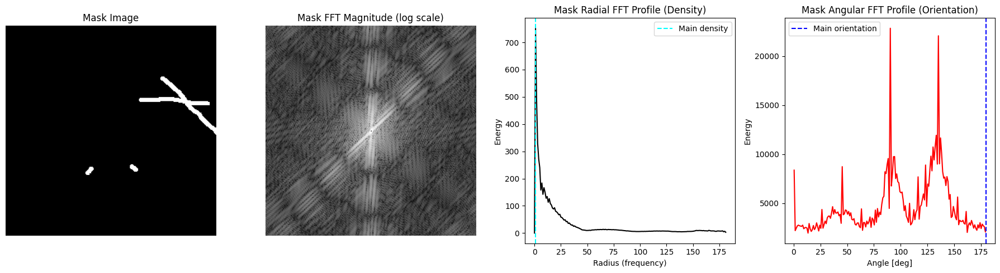

--- Original Image ---
Density frequency: 0.0156 cycles/pixel
Main orientation: 44.7°
Alignment Index: 1.770
Order Parameter: 0.410
Dominant spacing: ~64.0 px  (~1.250 μm)



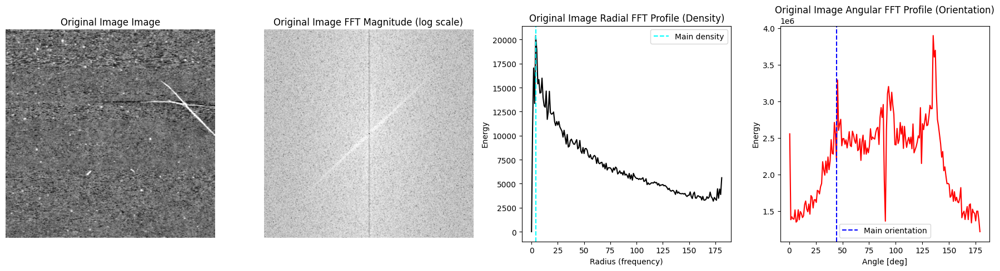

In [20]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
from scipy.signal import find_peaks

def fft_analysis(image, title_prefix=""):
    """Perform FFT analysis (radial, angular, orientation, etc.) on a given image."""
    if image.ndim == 3 and image.shape[2] == 3:
        image = image.mean(axis=2)
    if image.ndim > 2:
        image = image[0]
    image = image.astype(np.float32)

    # For masks, binarize — for grayscale images, skip this
    if title_prefix.lower().startswith("mask"):
        image = (image > 0).astype(np.uint8)

    # ---- FFT ----
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    fshift[image.shape[0]//2, image.shape[1]//2] = 0
    magnitude = np.abs(fshift)

    h, w = image.shape
    cy, cx = h//2, w//2

    # ---- Polar coordinates ----
    Y, X = np.indices((h, w))
    R = np.sqrt((X-cx)**2 + (Y-cy)**2).astype(int)
    theta = np.arctan2(Y-cy, X-cx)
    theta_deg = (np.rad2deg(theta) % 180)

    # ---- Radial profile ----
    radial_profile = np.bincount(R.ravel(), weights=magnitude.ravel()) / np.bincount(R.ravel())
    r = np.arange(len(radial_profile))

    peaks, _ = find_peaks(radial_profile, distance=5)
    main_r = peaks[np.argmax(radial_profile[peaks])] if len(peaks) > 0 else None
    density_freq = main_r / w if main_r is not None else None

    # ---- Angular profile ----
    angular_bins = 180
    hist, edges = np.histogram(theta_deg, bins=angular_bins, weights=magnitude)
    orientation_angle = edges[np.argmax(hist)]
    orientation_angle = (orientation_angle + 90) % 180

    # ---- Alignment Index ----
    alignment_index = np.max(hist) / np.mean(hist)

    # ---- Order Parameter ----
    if main_r:
        P_peak = radial_profile[main_r]
        mask_bg = (r > main_r + 10) & (r < len(r)//2)
        P_bg = np.mean(radial_profile[mask_bg]) if np.any(mask_bg) else 1
        order_parameter = (P_peak - P_bg) / (P_peak + P_bg)
    else:
        order_parameter = None

    # ---- Physical spacing ----
    field_um_x, field_um_y = 5.0, 5.0  # your AFM field size (μm)
    px_size_um_x = field_um_x / w
    px_size_um_y = field_um_y / h
    px_size_um = 0.5 * (px_size_um_x + px_size_um_y)

    if density_freq and density_freq > 0:
        spacing_px = 1.0 / density_freq
        spacing_um = spacing_px * px_size_um
    else:
        spacing_px = spacing_um = None

    # ---- Print results ----
    print(f"--- {title_prefix} ---")
    print(f"Density frequency: {density_freq:.4f} cycles/pixel" if density_freq else "Density not detected")
    print(f"Main orientation: {orientation_angle:.1f}°")
    print(f"Alignment Index: {alignment_index:.3f}")
    print(f"Order Parameter: {order_parameter:.3f}" if order_parameter is not None else "Order Parameter not detected")
    if spacing_px:
        print(f"Dominant spacing: ~{spacing_px:.1f} px  (~{spacing_um:.3f} μm)\n")
    else:
        print("Dominant spacing: not detected\n")

    # ---- Visualization ----
    fig, axes = plt.subplots(1, 4, figsize=(18, 5))
    axes[0].imshow(image, cmap="gray")
    axes[0].set_title(f"{title_prefix} Image")
    axes[0].axis("off")

    axes[1].imshow(np.log1p(magnitude), cmap="gray")
    axes[1].set_title(f"{title_prefix} FFT Magnitude (log scale)")
    axes[1].axis("off")

    axes[2].plot(r, radial_profile, color="black")
    if main_r:
        axes[2].axvline(main_r, color="cyan", linestyle="--", label="Main density")
    axes[2].set_title(f"{title_prefix} Radial FFT Profile (Density)")
    axes[2].set_xlabel("Radius (frequency)")
    axes[2].set_ylabel("Energy")
    axes[2].legend()

    centers = 0.5 * (edges[:-1] + edges[1:])
    axes[3].plot(centers, hist, color="red")
    axes[3].axvline(orientation_angle, color="blue", linestyle="--", label="Main orientation")
    axes[3].set_title(f"{title_prefix} Angular FFT Profile (Orientation)")
    axes[3].set_xlabel("Angle [deg]")
    axes[3].set_ylabel("Energy")
    axes[3].legend()

    plt.tight_layout()
    plt.show()


# ---- RUN BOTH ----
mask_path = "../../data/annotations_uniques/test/masks"
image_path = "../../data/annotations_uniques/test/images"
mask_filename = "400-1293-17-c10k1r5_pd_sp0_9_fl0_1_right.tif"

mask_image_path = os.path.join(mask_path, mask_filename)
original_image_path = os.path.join(image_path, mask_filename)

# Load both
mask = tiff.imread(mask_image_path)
image = tiff.imread(original_image_path)

# Perform FFT analyses
fft_analysis(mask, title_prefix="Mask")
fft_analysis(image, title_prefix="Original Image")


In [24]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
from scipy.signal import find_peaks
import pandas as pd

def fft_analysis(image, title_prefix=""):
    """Perform FFT analysis (radial, angular, orientation, etc.) on a given image."""
    if image.ndim == 3 and image.shape[2] == 3:
        image = image.mean(axis=2)
    if image.ndim > 2:
        image = image[0]
    image = image.astype(np.float32)

    # For masks, binarize — for grayscale images, skip this
    if title_prefix.lower().startswith("mask"):
        image = (image > 0).astype(np.uint8)

    # ---- FFT ----
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    fshift[image.shape[0]//2, image.shape[1]//2] = 0
    magnitude = np.abs(fshift)

    h, w = image.shape
    cy, cx = h//2, w//2

    # ---- Polar coordinates ----
    Y, X = np.indices((h, w))
    R = np.sqrt((X-cx)**2 + (Y-cy)**2).astype(int)
    theta = np.arctan2(Y-cy, X-cx)
    theta_deg = (np.rad2deg(theta) % 180)

    # ---- Radial profile ----
    radial_profile = np.bincount(R.ravel(), weights=magnitude.ravel()) / np.bincount(R.ravel())
    r = np.arange(len(radial_profile))

    peaks, _ = find_peaks(radial_profile, distance=5)
    main_r = peaks[np.argmax(radial_profile[peaks])] if len(peaks) > 0 else None
    density_freq = main_r / w if main_r is not None else None

    # ---- Angular profile ----
    angular_bins = 180
    hist, edges = np.histogram(theta_deg, bins=angular_bins, weights=magnitude)
    orientation_angle = edges[np.argmax(hist)]
    orientation_angle = (orientation_angle + 90) % 180

    # ---- Alignment Index ----
    alignment_index = np.max(hist) / np.mean(hist)

    # ---- Order Parameter ----
    if main_r:
        P_peak = radial_profile[main_r]
        mask_bg = (r > main_r + 10) & (r < len(r)//2)
        P_bg = np.mean(radial_profile[mask_bg]) if np.any(mask_bg) else 1
        order_parameter = (P_peak - P_bg) / (P_peak + P_bg)
    else:
        order_parameter = None

    # ---- Physical spacing ----
    field_um_x, field_um_y = 5.0, 5.0  # your AFM field size (μm)
    px_size_um_x = field_um_x / w
    px_size_um_y = field_um_y / h
    px_size_um = 0.5 * (px_size_um_x + px_size_um_y)

    if density_freq and density_freq > 0:
        spacing_px = 1.0 / density_freq
        spacing_um = spacing_px * px_size_um
    else:
        spacing_px = spacing_um = None

    # Return results as dictionary
    results = {
        'density_freq': density_freq,
        'orientation_angle': orientation_angle,
        'alignment_index': alignment_index,
        'order_parameter': order_parameter,
        'spacing_px': spacing_px,
        'spacing_um': spacing_um
    }
    
    return results

def compute_differences(mask_results, image_results):
    """Compute differences between mask and image results"""
    differences = {}
    
    # Helper function to safely calculate differences
    def safe_diff(mask_val, image_val):
        if mask_val is None or image_val is None:
            return None
        else:
            return abs(image_val - mask_val)
    
    # Calculate all differences
    differences['density_freq'] = safe_diff(mask_results['density_freq'], image_results['density_freq'])
    differences['orientation_angle'] = safe_diff(mask_results['orientation_angle'], image_results['orientation_angle'])
    differences['alignment_index'] = safe_diff(mask_results['alignment_index'], image_results['alignment_index'])
    differences['order_parameter'] = safe_diff(mask_results['order_parameter'], image_results['order_parameter'])
    differences['spacing_px'] = safe_diff(mask_results['spacing_px'], image_results['spacing_px'])
    differences['spacing_um'] = safe_diff(mask_results['spacing_um'], image_results['spacing_um'])
    
    return differences

def print_summary_table(all_differences):
    """Print a summary table of mean absolute differences"""
    if not all_differences:
        print("No data to display in summary table.")
        return
    
    # Create a DataFrame for easier calculation
    df_data = []
    for filename, diffs in all_differences.items():
        row = {'filename': filename}
        row.update(diffs)
        df_data.append(row)
    
    df = pd.DataFrame(df_data)
    
    # Calculate mean absolute differences (ignoring None values)
    summary_data = []
    features = [
        'density_freq', 
        'orientation_angle', 
        'alignment_index', 
        'order_parameter', 
        'spacing_px',
        'spacing_um'
    ]
    feature_names = [
        'Density Frequency', 
        'Orientation Angle', 
        'Alignment Index', 
        'Order Parameter', 
        'Dominant Spacing (px)',
        'Dominant Spacing (μm)'
    ]
    units = ['cycles/pixel', '°', '', '', 'px', 'μm']
    
    for feature, name, unit in zip(features, feature_names, units):
        valid_values = [x for x in df[feature] if x is not None]
        if valid_values:
            mean_diff = np.mean(valid_values)
            std_diff = np.std(valid_values)
            count = len(valid_values)
            total = len(df)
            summary_data.append({
                'Feature': name,
                'Mean Absolute Difference': f"{mean_diff:.4f}",
                'Standard Deviation': f"{std_diff:.4f}",
                'Valid Samples': f"{count}/{total}",
                'Unit': unit
            })
        else:
            summary_data.append({
                'Feature': name,
                'Mean Absolute Difference': "N/A",
                'Standard Deviation': "N/A", 
                'Valid Samples': f"0/{len(df)}",
                'Unit': unit
            })
    
    summary_df = pd.DataFrame(summary_data)
    
    print(f"\n{'='*80}")
    print(f"SUMMARY TABLE: MEAN ABSOLUTE DIFFERENCES ACROSS ALL IMAGES")
    print(f"{'='*80}")
    print(summary_df.to_string(index=False))
    
    return summary_df

# ---- PROCESS ALL IMAGES ----
mask_path = "../../data/annotations_uniques/test/masks"
image_path = "../../data/annotations_uniques/test/images"

# Get all mask files
mask_files = [f for f in os.listdir(mask_path) if f.endswith(('.tif', '.tiff', '.png', '.jpg', '.jpeg'))]

print(f"Found {len(mask_files)} mask files to process...")
print("Processing images (this may take a while)...")

# Dictionary to store all differences
all_differences = {}
processed_count = 0

for mask_filename in mask_files:
    mask_image_path = os.path.join(mask_path, mask_filename)
    original_image_path = os.path.join(image_path, mask_filename)
    
    # Check if corresponding image exists
    if not os.path.exists(original_image_path):
        print(f"Warning: No corresponding image found for {mask_filename} in images folder. Skipping.")
        continue
    
    try:
        # Load both images
        mask = tiff.imread(mask_image_path)
        image = tiff.imread(original_image_path)
        
        # Perform FFT analyses
        mask_results = fft_analysis(mask, title_prefix="Mask")
        image_results = fft_analysis(image, title_prefix="Original Image")
        
        # Compute differences
        differences = compute_differences(mask_results, image_results)
        all_differences[mask_filename] = differences
        
        processed_count += 1
        print(f"Processed {processed_count}/{len(mask_files)}: {mask_filename}")
        
    except Exception as e:
        print(f"Error processing {mask_filename}: {str(e)}")
        continue

# Print summary table
summary_df = print_summary_table(all_differences)

print(f"\n{'='*80}")
print(f"PROCESSING COMPLETE: Successfully processed {processed_count} image pairs")
print(f"{'='*80}")

Found 30 mask files to process...
Processing images (this may take a while)...
Processed 1/30: 1293-22_3_2_20230306222551.tif
Processed 2/30: 400-1093-w11-c1p1-befo3-10sp-15flow_left.tif
Processed 3/30: 400-1093-w11-c1p2-befo3-20sp-15flow_left.tif
Processed 4/30: 400-1093-w13-c1-p1-10sp-15flow_left.tif
Processed 5/30: 400-1093-w16-c-1-p1-10sp-15flow_left.tif
Processed 6/30: 400-1093-w17-c1p3-20sp-03flow_right.tif
Processed 7/30: 400-1293-17-c10k1r5_pd_sp0_9_fl0_1_right.tif
Processed 8/30: 400-1293-17-c3k1r5_pd_sp0_3_fl0_1_left.tif
Processed 9/30: 400-1293-17-c3k1r5_pd_sp0_3_fl0_1_right.tif
Processed 10/30: 400-1293-17-c79k1r5_pd_sp0_6_fl0_1_right.tif
Processed 11/30: 400-1293-18_cd_c11k4r9_fl1_0sp9_image_right.tif
Processed 12/30: 400-1293-18_cd_c1k1r3_fl0_3sp0_3_image_left.tif
Processed 13/30: 400-1293-18_cd_c1k40r9_fl3_0sp9_0_image_right.tif
Processed 14/30: 400-1293-23_3_0_20230307080848.tif
Processed 15/30: 400-1293-w14_c05k1r6_sp0_2_flow0_1_top_left.tif
Processed 16/30: 400-1293-w

# run the analysis on all images


--- Processing 1293-22_3_2_20230306222551.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 179.8°
Alignment Index: 2.478
Order Parameter: 0.644
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


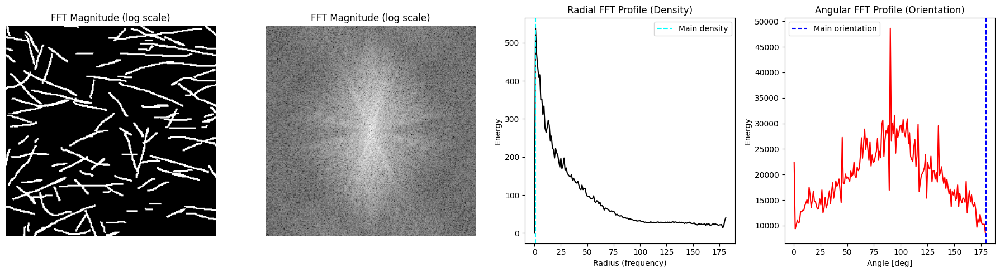


--- Processing 400-1093-w11-c1p1-befo3-10sp-15flow_left.tif ---
Density frequency: 0.0117 cycles/pixel
Main orientation: 179.8°
Alignment Index: 2.626
Order Parameter: 0.728
Dominant spacing: ~85.3 px  (~1.667 μm)  [pixel size ≈ 0.0195 μm/px]


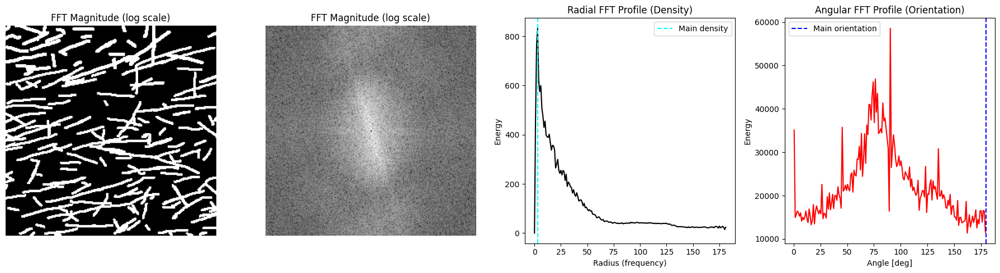


--- Processing 400-1093-w11-c1p2-befo3-20sp-15flow_left.tif ---
Density frequency: 0.0117 cycles/pixel
Main orientation: 179.8°
Alignment Index: 2.634
Order Parameter: 0.644
Dominant spacing: ~85.3 px  (~1.667 μm)  [pixel size ≈ 0.0195 μm/px]


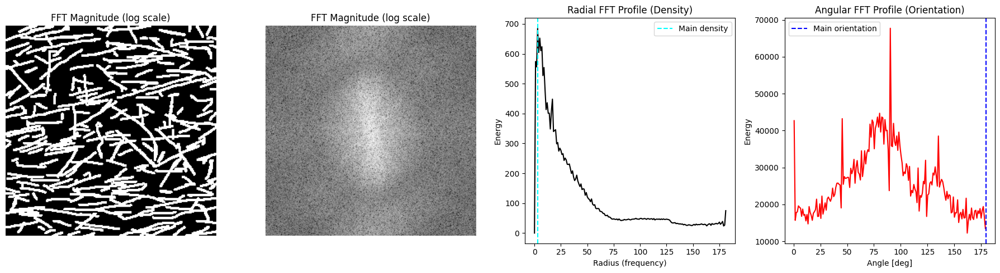


--- Processing 400-1093-w13-c1-p1-10sp-15flow_left.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 134.9°
Alignment Index: 2.494
Order Parameter: 0.757
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


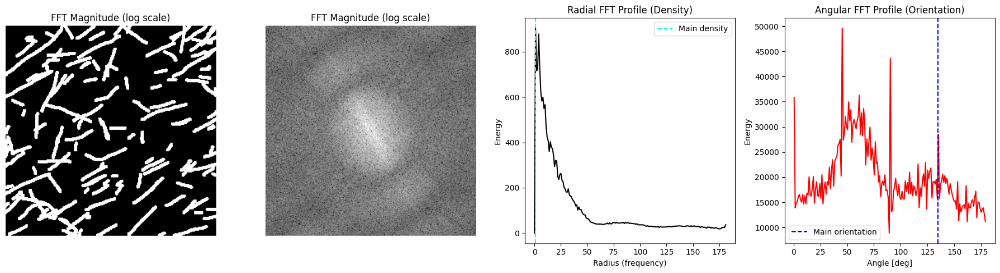


--- Processing 400-1093-w16-c-1-p1-10sp-15flow_left.tif ---
Density frequency: 0.0078 cycles/pixel
Main orientation: 179.8°
Alignment Index: 2.059
Order Parameter: 0.680
Dominant spacing: ~128.0 px  (~2.500 μm)  [pixel size ≈ 0.0195 μm/px]


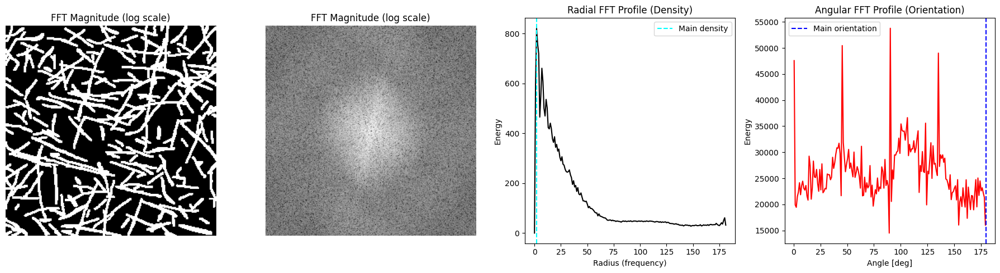


--- Processing 400-1093-w17-c1p3-20sp-03flow_right.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 134.9°
Alignment Index: 1.930
Order Parameter: 0.543
Dominant spacing: ~42.7 px  (~0.833 μm)  [pixel size ≈ 0.0195 μm/px]


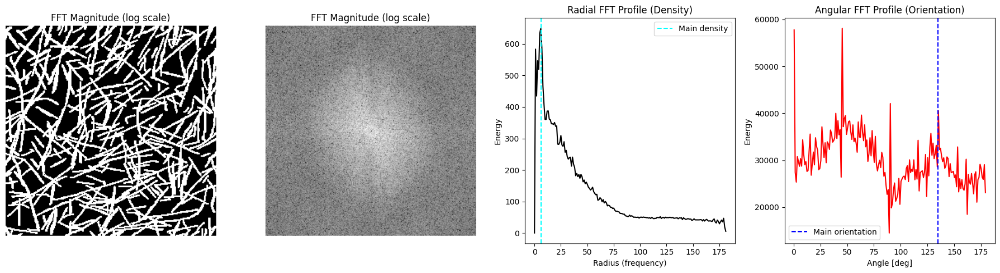


--- Processing 400-1293-17-c10k1r5_pd_sp0_9_fl0_1_right.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 179.8°
Alignment Index: 4.883
Order Parameter: 0.922
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


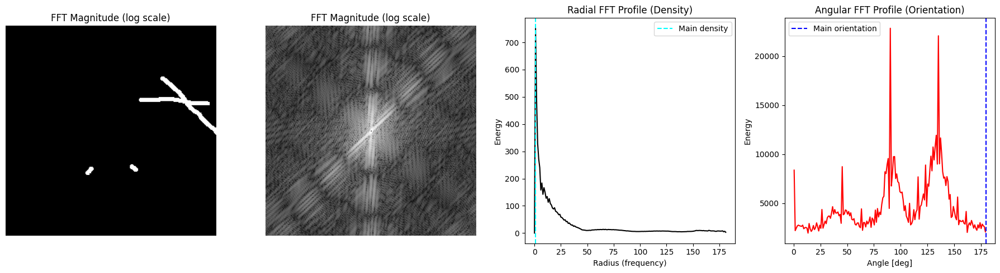


--- Processing 400-1293-17-c3k1r5_pd_sp0_3_fl0_1_left.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 44.7°
Alignment Index: 2.961
Order Parameter: 0.895
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


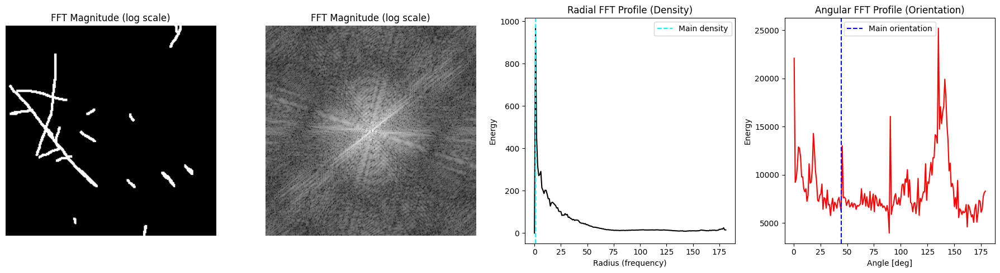


--- Processing 400-1293-17-c3k1r5_pd_sp0_3_fl0_1_right.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 179.8°
Alignment Index: 2.475
Order Parameter: 0.728
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


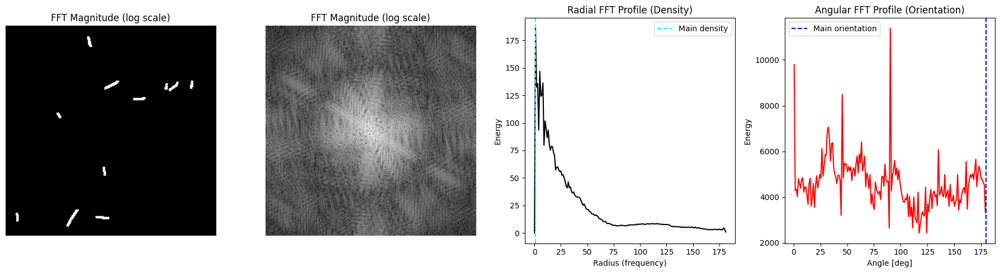


--- Processing 400-1293-17-c79k1r5_pd_sp0_6_fl0_1_right.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 179.8°
Alignment Index: 2.738
Order Parameter: 0.808
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


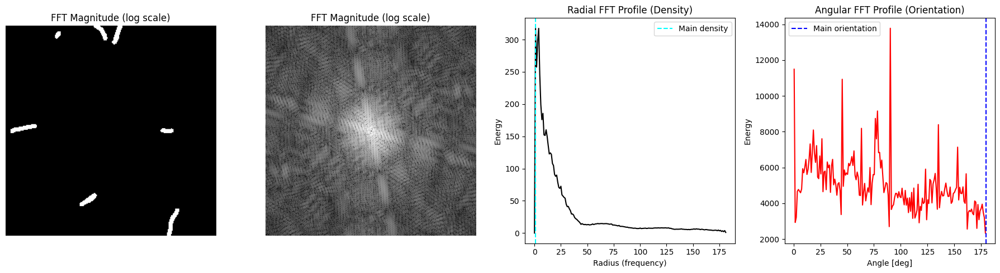


--- Processing 400-1293-18_cd_c11k4r9_fl1_0sp9_image_right.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 90.0°
Alignment Index: 2.544
Order Parameter: 0.692
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


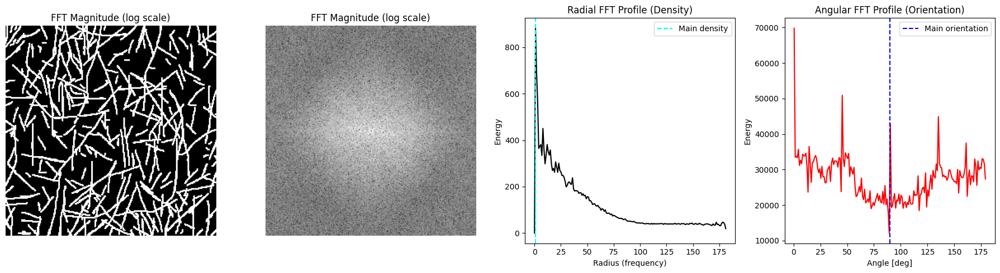


--- Processing 400-1293-18_cd_c1k1r3_fl0_3sp0_3_image_left.tif ---
Density frequency: 0.0078 cycles/pixel
Main orientation: 90.0°
Alignment Index: 2.400
Order Parameter: 0.792
Dominant spacing: ~128.0 px  (~2.500 μm)  [pixel size ≈ 0.0195 μm/px]


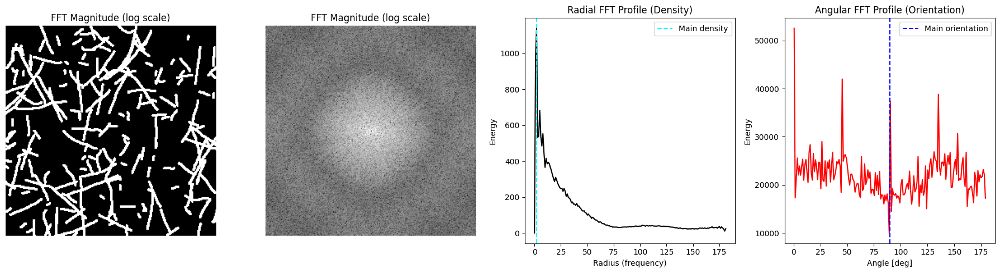


--- Processing 400-1293-18_cd_c1k40r9_fl3_0sp9_0_image_right.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 90.0°
Alignment Index: 2.475
Order Parameter: 0.594
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


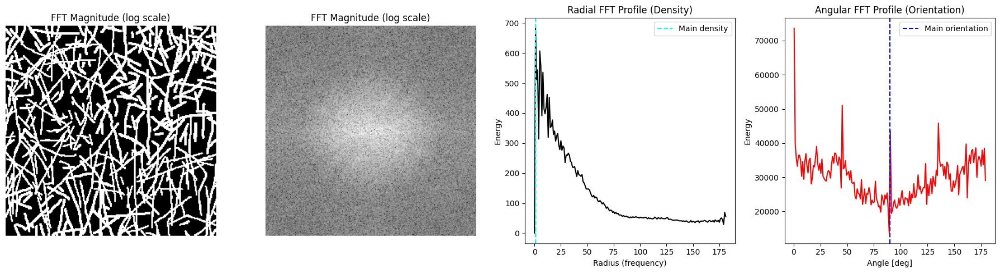


--- Processing 400-1293-23_3_0_20230307080848.tif ---
Density frequency: 0.0078 cycles/pixel
Main orientation: 179.8°
Alignment Index: 2.417
Order Parameter: 0.719
Dominant spacing: ~128.0 px  (~2.500 μm)  [pixel size ≈ 0.0195 μm/px]


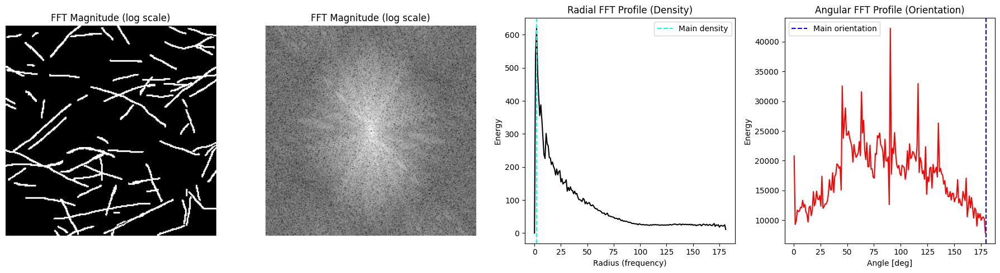


--- Processing 400-1293-w14_c05k1r6_sp0_2_flow0_1_top_left.tif ---
Density frequency: 0.0078 cycles/pixel
Main orientation: 179.8°
Alignment Index: 2.476
Order Parameter: 0.826
Dominant spacing: ~128.0 px  (~2.500 μm)  [pixel size ≈ 0.0195 μm/px]


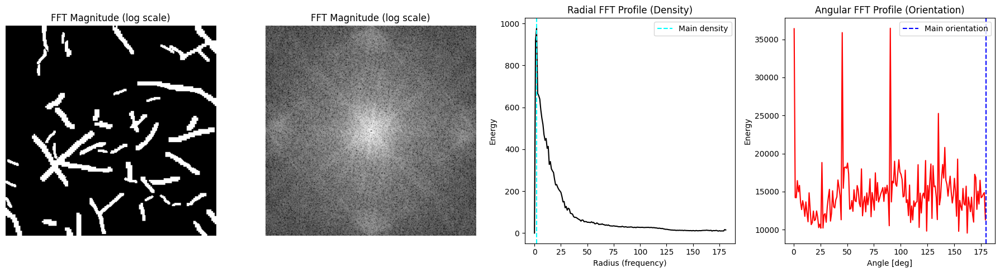


--- Processing 400-1293-w14_c06k1r6_sp0_6_flow0_1_top_left.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 179.8°
Alignment Index: 3.454
Order Parameter: 0.872
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


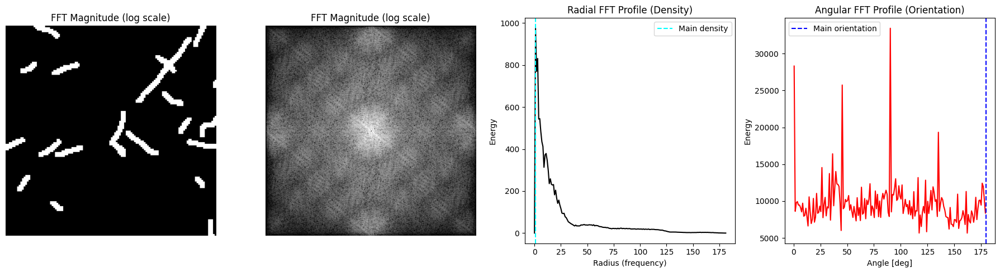


--- Processing 400-1293-w14_c09k1r6_sp0_1_flow0_1_bottom_right.tif ---
Density frequency: 0.0078 cycles/pixel
Main orientation: 90.0°
Alignment Index: 2.680
Order Parameter: 0.838
Dominant spacing: ~128.0 px  (~2.500 μm)  [pixel size ≈ 0.0195 μm/px]


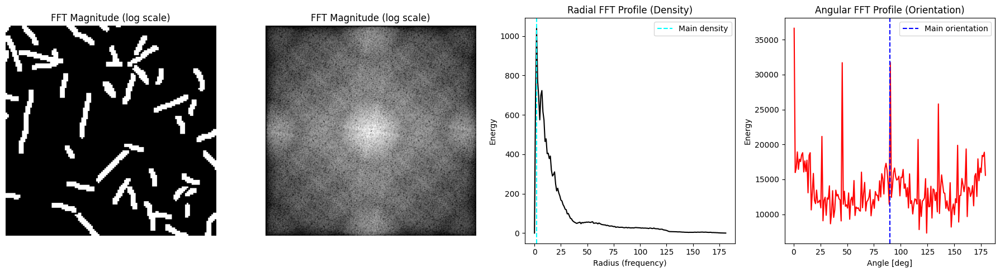


--- Processing 400-1605-W1_map_00030_bottom_right.tif ---
Density frequency: 0.0078 cycles/pixel
Main orientation: 90.0°
Alignment Index: 2.478
Order Parameter: 0.627
Dominant spacing: ~128.0 px  (~2.500 μm)  [pixel size ≈ 0.0195 μm/px]


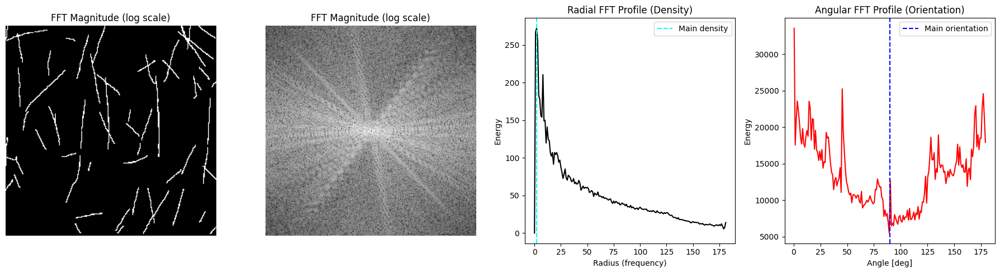


--- Processing 400-1605-W1_map_00039_bottom_left.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 134.9°
Alignment Index: 2.000
Order Parameter: 0.726
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


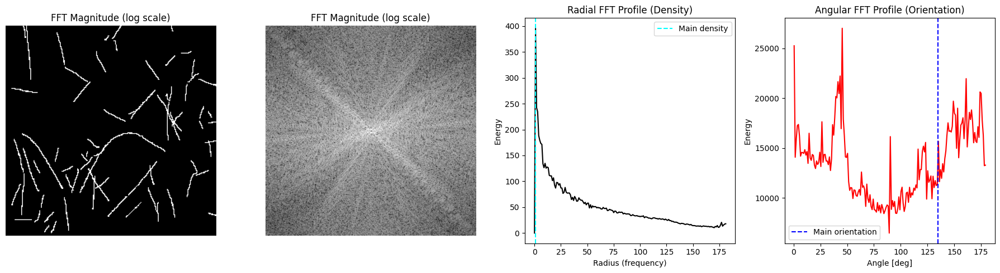


--- Processing 400-1605-W2_map_00046_bottom_right.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 90.0°
Alignment Index: 3.615
Order Parameter: 0.702
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


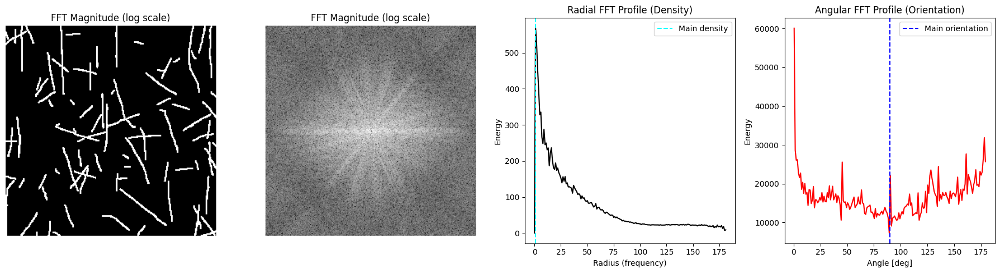


--- Processing 400-1605-W3_map_00034_1.tif ---
Density frequency: 0.0117 cycles/pixel
Main orientation: 90.0°
Alignment Index: 2.559
Order Parameter: 0.658
Dominant spacing: ~85.3 px  (~1.667 μm)  [pixel size ≈ 0.0195 μm/px]


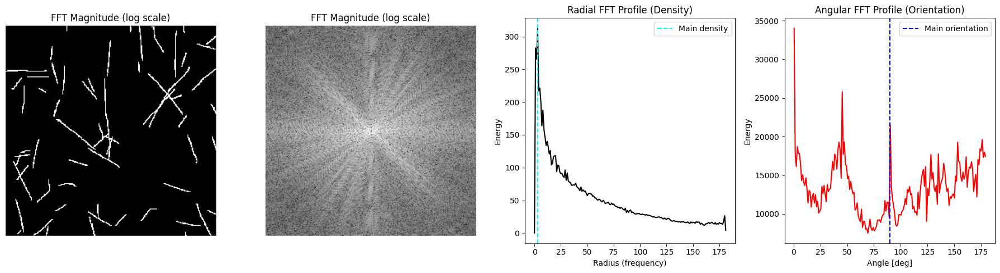


--- Processing 400-1605-W3_map_00034_top_left.tif ---
Density frequency: 0.0117 cycles/pixel
Main orientation: 90.0°
Alignment Index: 2.714
Order Parameter: 0.711
Dominant spacing: ~85.3 px  (~1.667 μm)  [pixel size ≈ 0.0195 μm/px]


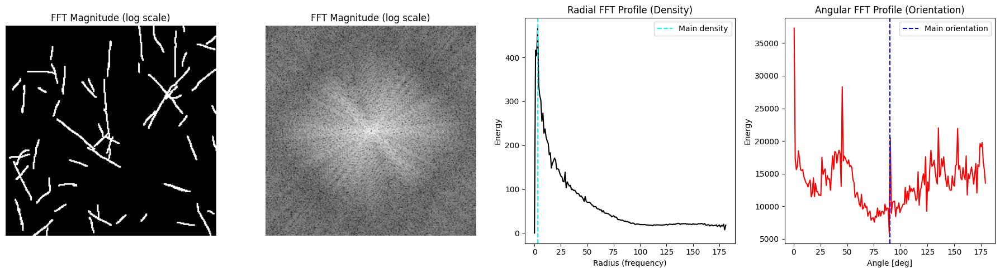


--- Processing 400-1605-W3_map_00041_1.tif ---
Density frequency: 0.0078 cycles/pixel
Main orientation: 90.0°
Alignment Index: 2.371
Order Parameter: 0.650
Dominant spacing: ~128.0 px  (~2.500 μm)  [pixel size ≈ 0.0195 μm/px]


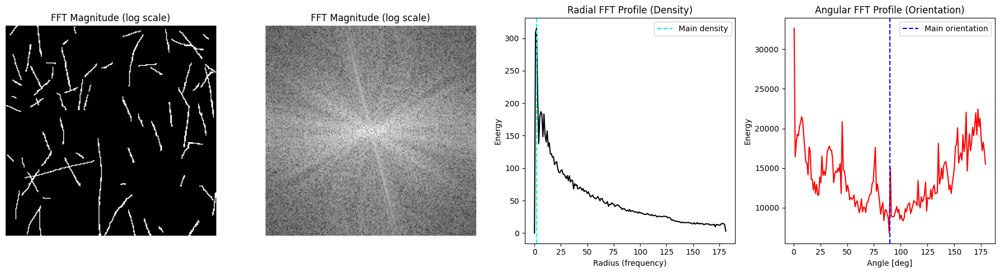


--- Processing 400-1605-W7_map_00021_4.tif ---
Density frequency: 0.0156 cycles/pixel
Main orientation: 90.0°
Alignment Index: 2.740
Order Parameter: 0.669
Dominant spacing: ~64.0 px  (~1.250 μm)  [pixel size ≈ 0.0195 μm/px]


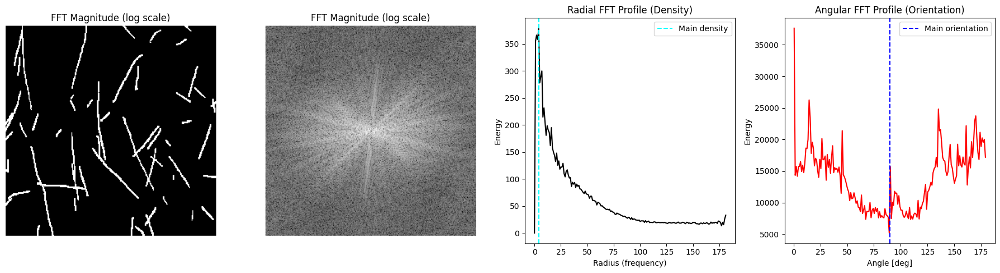


--- Processing 400-1605-W7_map_00028_3.tif ---
Density frequency: 0.0117 cycles/pixel
Main orientation: 90.0°
Alignment Index: 3.361
Order Parameter: 0.707
Dominant spacing: ~85.3 px  (~1.667 μm)  [pixel size ≈ 0.0195 μm/px]


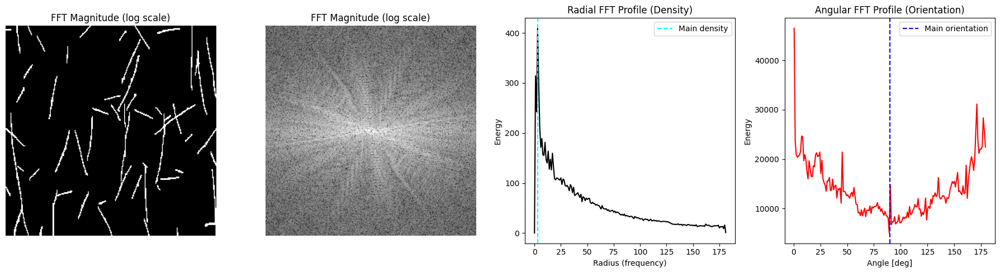


--- Processing 400-1605-W8_map_00006_bottom_right.tif ---
Density frequency: 0.0078 cycles/pixel
Main orientation: 90.0°
Alignment Index: 4.758
Order Parameter: 0.793
Dominant spacing: ~128.0 px  (~2.500 μm)  [pixel size ≈ 0.0195 μm/px]


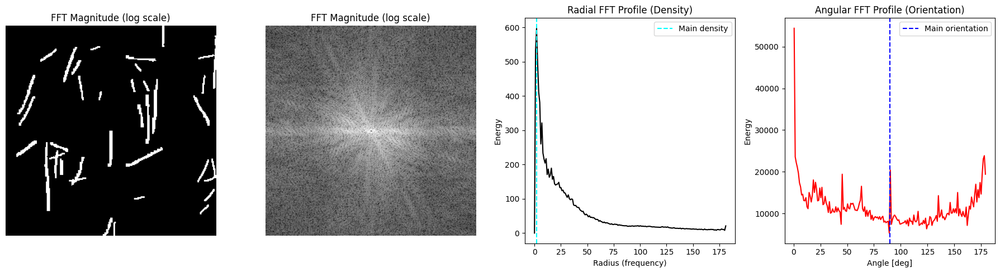


--- Processing 400-1605-W8_map_00038_3.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 90.0°
Alignment Index: 4.233
Order Parameter: 0.790
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


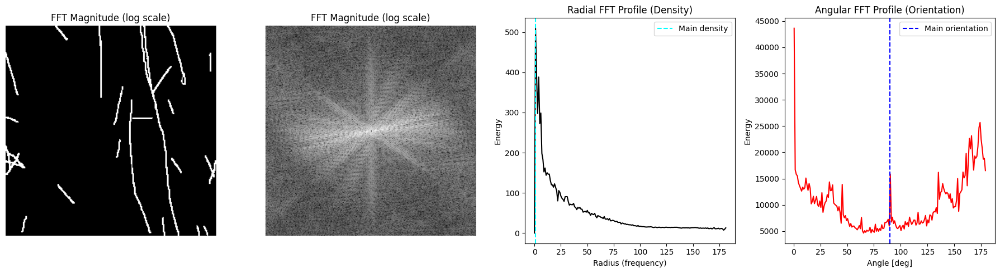


--- Processing 400-1605-W8_map_00047_3.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 90.0°
Alignment Index: 2.363
Order Parameter: 0.703
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


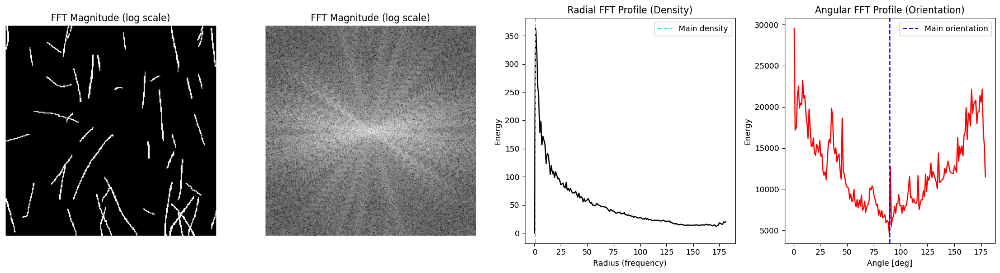


--- Processing 400-1605-W8_map_00049_1.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 90.0°
Alignment Index: 2.662
Order Parameter: 0.750
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


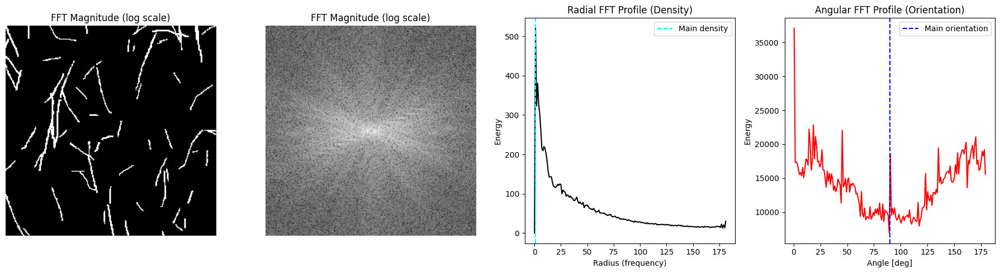


--- Processing 400-1605-W8_map_00049_top_right.tif ---
Density frequency: 0.0039 cycles/pixel
Main orientation: 90.0°
Alignment Index: 2.738
Order Parameter: 0.701
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


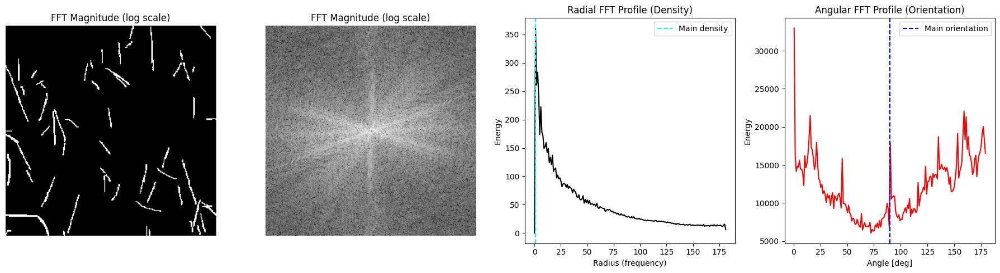


--- Processing test.tif ---
Density frequency: 0.0012 cycles/pixel
Main orientation: 90.0°
Alignment Index: 49.545
Order Parameter: 0.960
Dominant spacing: ~103.7 px  (~0.647 μm)  [pixel size ≈ 0.0062 μm/px]


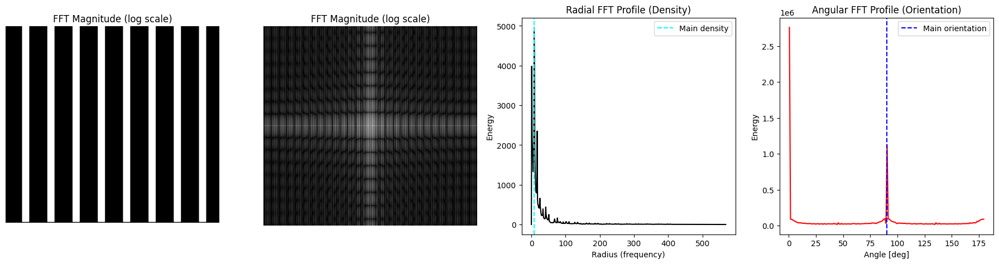

In [10]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import tifffile as tiff  # Ensure this library is imported

# ---- Load TIFF masks FROM GROUNDTRUTH ----
mask_path = "../../data/annotations_uniques/test/masks"

# Iterate through all TIFF files in the directory
for mask_filename in os.listdir(mask_path):
    if mask_filename.endswith(('.tif', '.tiff')):  # Process only TIFF files:cite[6]
        print(f"\n--- Processing {mask_filename} ---")
        
        mask_image_path = os.path.join(mask_path, mask_filename)
        mask = tiff.imread(mask_image_path)
        
        # --- Your existing processing code below ---
        if mask.ndim == 3 and mask.shape[2] == 3:
            mask = mask.mean(axis=2)
        if mask.ndim > 2:
            mask = mask[0]
        mask = mask.astype(np.float32)
        mask = (mask > 0).astype(np.uint8)

        f = np.fft.fft2(mask)
        fshift = np.fft.fftshift(f)
        fshift[mask.shape[0]//2, mask.shape[1]//2] = 0
        magnitude = np.abs(fshift)

        h, w = mask.shape
        cy, cx = h//2, w//2

        Y, X = np.indices((h, w))
        R = np.sqrt((X-cx)**2 + (Y-cy)**2).astype(int)
        theta = np.arctan2(Y-cy, X-cx)
        theta_deg = (np.rad2deg(theta) % 180)

        radial_profile = np.bincount(R.ravel(), weights=magnitude.ravel()) / np.bincount(R.ravel())
        r = np.arange(len(radial_profile))

        peaks, _ = find_peaks(radial_profile, distance=5)
        if len(peaks) > 0:
            main_r = peaks[0]
            density_freq = main_r / w
        else:
            main_r = None
            density_freq = None

        angular_bins = 180
        hist, edges = np.histogram(theta_deg, bins=angular_bins, weights=magnitude)
        orientation_angle = edges[np.argmax(hist)]
        orientation_angle = (orientation_angle + 90) % 180

        alignment_index = np.max(hist) / np.mean(hist)

        if main_r:
            P_peak = radial_profile[main_r]
            mask_bg = (r > main_r + 10) & (r < len(r)//2)
            P_bg = np.mean(radial_profile[mask_bg]) if np.any(mask_bg) else 1
            order_parameter = (P_peak - P_bg) / (P_peak + P_bg)
        else:
            order_parameter = None

        # ---- Print results ----
        print(f"Density frequency: {density_freq:.4f} cycles/pixel" if density_freq else "Density not detected")
        print(f"Main orientation: {orientation_angle:.1f}°")
        print(f"Alignment Index: {alignment_index:.3f}")
        print(f"Order Parameter: {order_parameter:.3f}" if order_parameter is not None else "Order Parameter not detected")

        peaks, _ = find_peaks(radial_profile, distance=5)
        if len(peaks) > 0:
            main_r = peaks[np.argmax(radial_profile[peaks])]
        else:
            main_r = None

        field_um_x, field_um_y = 5.0, 5.0
        px_size_um_x = field_um_x / w
        px_size_um_y = field_um_y / h
        px_size_um = 0.5 * (px_size_um_x + px_size_um_y)

        if main_r is not None and main_r > 0:
            density_freq_cyc_per_px = main_r / w
            spacing_px = 1.0 / density_freq_cyc_per_px
            spacing_um = spacing_px * px_size_um
            print(f"Dominant spacing: ~{spacing_px:.1f} px  (~{spacing_um:.3f} μm)  [pixel size ≈ {px_size_um:.4f} μm/px]")
        else:
            print("Dominant spacing: not detected (no clear radial peak)")

        # ---- Visualization ----
        fig, axes = plt.subplots(1, 4, figsize=(18, 5))

        axes[0].imshow(mask, cmap="gray")
        axes[0].set_title("FFT Magnitude (log scale)")
        axes[0].axis("off")

        axes[1].imshow(np.log1p(magnitude), cmap="gray")
        axes[1].set_title("FFT Magnitude (log scale)")
        axes[1].axis("off")

        axes[2].plot(r, radial_profile, color="black")
        if main_r:
            axes[2].axvline(main_r, color="cyan", linestyle="--", label="Main density")
        axes[2].set_title("Radial FFT Profile (Density)")
        axes[2].set_xlabel("Radius (frequency)")
        axes[2].set_ylabel("Energy")
        axes[2].legend()

        centers = 0.5 * (edges[:-1] + edges[1:])
        axes[3].plot(centers, hist, color="red")
        axes[3].axvline(orientation_angle, color="blue", linestyle="--", label="Main orientation")
        axes[3].set_title("Angular FFT Profile (Orientation)")
        axes[3].set_xlabel("Angle [deg]")
        axes[3].set_ylabel("Energy")
        axes[3].legend()

        plt.tight_layout()
        plt.show()

If the above code does not output good correlation, extract density info from the FT magnitude and not from the radial curve maybe.. 

Line scan crosses 74 objects → density = 0.289062 objects/pixel


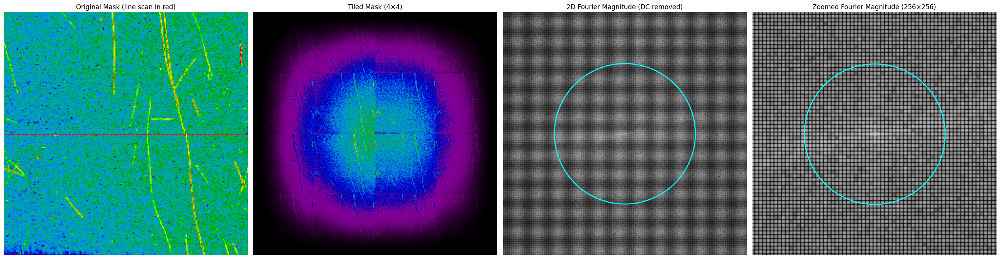

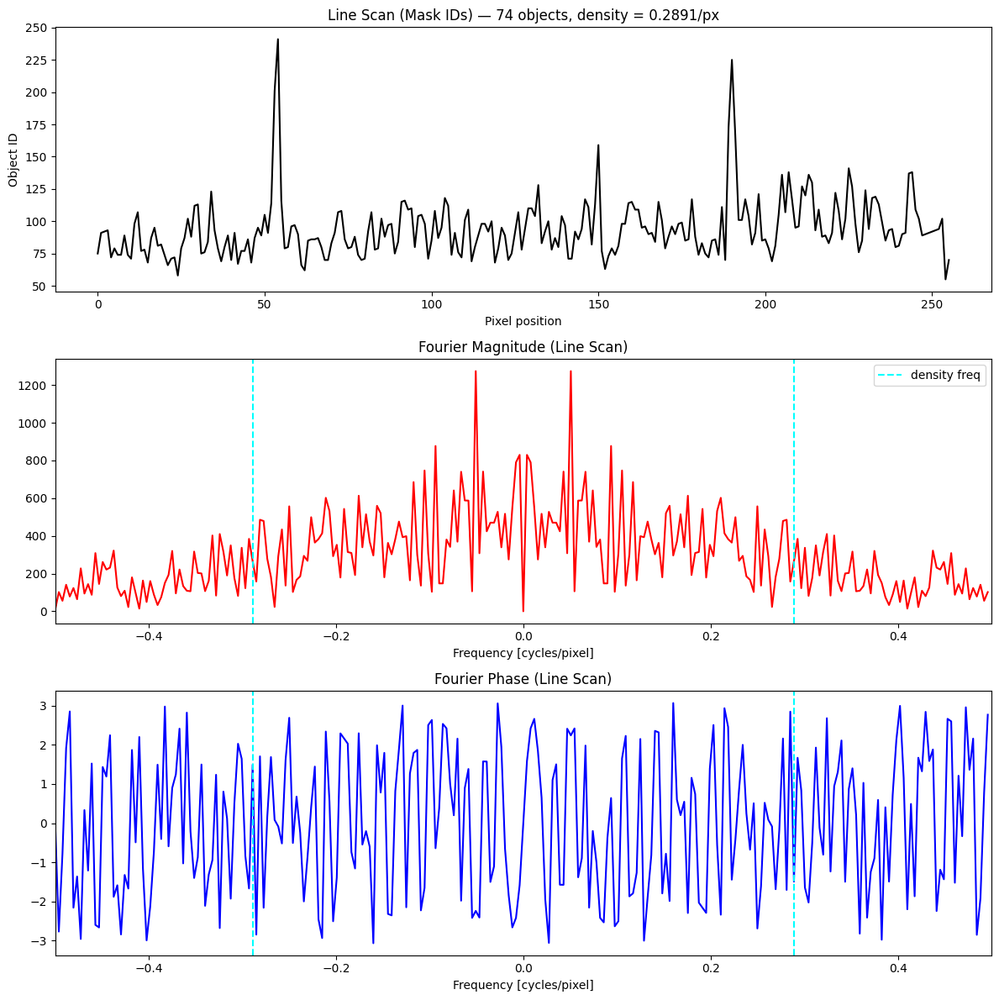

In [1]:
# An eymaple with tiling and no radial computation
# It doesn t work super well
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
import os

# ---- Parameters ----
mask_path = "../../data/annotations_uniques/test/images"

# mask_path = r"../../../../../data/annotations_filtered_artifacts/test/masks"
mask_filename = "400-1605-W8_map_00038_3.tif"
mask_image_path = os.path.join(mask_path, mask_filename)

tile_factor = 4       # repeat image this many times
apply_window = True   # apply Hann window to reduce edge effects
zoom = 128            # zoomed FFT window size

# ---- Load mask ----
mask = tiff.imread(mask_image_path)
if mask.ndim == 3 and mask.shape[2] == 3:
    mask = mask.mean(axis=2)
if mask.ndim > 2:  
    mask = mask[0]
mask = mask.astype(np.int32)

# ---- Tile the mask to increase periodicity ----
mask_tiled = np.tile(mask, (tile_factor, tile_factor))

# ---- Optional: Apply Hann window ----
if apply_window:
    wy = np.hanning(mask_tiled.shape[0])
    wx = np.hanning(mask_tiled.shape[1])
    window = np.outer(wy, wx)
    mask_tiled = mask_tiled * window

# ---- Line scan (middle row) ----
line_y = mask.shape[0] // 2
scan_line = mask[line_y, :]

unique_ids = np.unique(scan_line)
unique_ids = unique_ids[unique_ids != 0]
num_objects = len(unique_ids)

image_width = mask.shape[1]
density_per_pixel = num_objects / image_width
expected_freq = density_per_pixel

print(f"Line scan crosses {num_objects} objects → density = {density_per_pixel:.6f} objects/pixel")

# ---- 2D FFT ----
f = np.fft.fft2(mask_tiled.astype(np.float32))
fshift = np.fft.fftshift(f)
fshift[mask_tiled.shape[0]//2, mask_tiled.shape[1]//2] = 0  # remove DC

magnitude = np.log1p(np.abs(fshift))
phase = np.angle(fshift)

h, w = mask_tiled.shape
center = (h//2, w//2)

# ---- Figure 1: Mask + FFT ----
fig, axes = plt.subplots(1, 4, figsize=(26, 7))

axes[0].imshow(mask, cmap="nipy_spectral")
axes[0].axhline(line_y, color="red", linestyle="--")
axes[0].set_title("Original Mask (line scan in red)")
axes[0].axis("off")

axes[1].imshow(mask_tiled, cmap="nipy_spectral")
axes[1].set_title(f"Tiled Mask ({tile_factor}×{tile_factor})")
axes[1].axis("off")

axes[2].imshow(magnitude, cmap="gray")
circle = plt.Circle((w//2, h//2), radius=(expected_freq * w),
                    color="cyan", fill=False, linewidth=2)
axes[2].add_patch(circle)
axes[2].set_title("2D Fourier Magnitude (DC removed)")
axes[2].axis("off")

mag_zoom = magnitude[center[0]-zoom:center[0]+zoom, center[1]-zoom:center[1]+zoom]
axes[3].imshow(mag_zoom, cmap="gray")
circle_zoom = plt.Circle((zoom, zoom), radius=(expected_freq * w * (2*zoom)/w),
                         color="cyan", fill=False, linewidth=2)
axes[3].add_patch(circle_zoom)
axes[3].set_title(f"Zoomed Fourier Magnitude ({2*zoom}×{2*zoom})")
axes[3].axis("off")

plt.tight_layout()
plt.show()

# ---- 1D FFT of line scan ----
scan_line_float = scan_line.astype(np.float32)
N = len(scan_line_float)
f_line = np.fft.fft(scan_line_float)
f_line_shift = np.fft.fftshift(f_line)
f_line_shift[N//2] = 0  # remove DC

freqs = np.fft.fftfreq(N, d=1.0)
freqs_shift = np.fft.fftshift(freqs)
mag_line = np.abs(f_line_shift)
phase_line = np.angle(f_line_shift)

# ---- Figure 2: Line scan + FFT ----
fig, axes = plt.subplots(3, 1, figsize=(12, 12))

axes[0].plot(scan_line, color="black")
axes[0].set_title(f"Line Scan (Mask IDs) — {num_objects} objects, density = {density_per_pixel:.4f}/px")
axes[0].set_xlabel("Pixel position")
axes[0].set_ylabel("Object ID")

axes[1].plot(freqs_shift, mag_line, color="red")
axes[1].axvline(expected_freq, color="cyan", linestyle="--", label="density freq")
axes[1].axvline(-expected_freq, color="cyan", linestyle="--")
axes[1].set_xlim(-0.5, 0.5)  # zoom in on main band
axes[1].set_title("Fourier Magnitude (Line Scan)")
axes[1].set_xlabel("Frequency [cycles/pixel]")
axes[1].legend()

axes[2].plot(freqs_shift, phase_line, color="blue")
axes[2].axvline(expected_freq, color="cyan", linestyle="--")
axes[2].axvline(-expected_freq, color="cyan", linestyle="--")
axes[2].set_xlim(-0.5, 0.5)
axes[2].set_title("Fourier Phase (Line Scan)")
axes[2].set_xlabel("Frequency [cycles/pixel]")

plt.tight_layout()
plt.show()
